In [1]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
from tqdm.auto import tqdm
from tqdm.notebook import tqdm as tqdm
# tqdm.pandas() # Prep tqdm for pandas
import numpy as np
import re
import math
from scipy import stats
from collections import Counter

from statistics import stdev, mean, median

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

import time
import os
import subprocess as subp
import re

from scipy import stats
from statsmodels.stats import multitest

from skbio.stats.composition import ilr, clr

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import random as rand

#Create a color scheme
sayf_colors = ["#1B4F72", "#641E16", "#7D6608", "#1B2631", "#E74C3C", "#9B59B6", "#2980B9",\
               "#1ABC9C", "#F1C40F", "#95A5A6", "#E67E22", "#2ECC71", "#85C1E9", "#D7BDE2",\
               "#4A235A", "#A3E4D7", "#784212", "#FCF3CF", "#F342DF", "#FFFD37", "#0A0A0A",\
               "#69FF00", "#ED9FEC", "#00FCFF", "#8E9EF2", "#FF1700"]

plt.style.use('seaborn-darkgrid')
plt.style.use('seaborn-notebook')
#sns.set_palette(sayf_colors)

#Create a color map as well
from matplotlib.colors import ListedColormap
sayf_cmap = ListedColormap(sayf_colors[5:])

# Turn off the SettingWithCopy warning
pd.set_option('mode.chained_assignment', None)

# Taxonomic analysis

## Import the relative abundance data

- hmp: Human Microbiome Project samples (external healthy control)
    - Referred to as Healthy-1 cohort in manuscript
    - Obtained from Human microbiome project data portal<sup>1</sup> (https://portal.hmpdacc.org/)
    
    <br>
    
- ibd: Inflammatory Bowel Disease samples
    - Contains IBD samples that are not dysbiotic
    - From IBDMDB publication<sup>2</sup>
    
    <br>
    
- nibd: Non-IBD samples (internal healthy control)
    - Contains samples found to not have IBD but not necessarily healthy
    - Obtained from IBDMDB publication<sup>2</sup>
    
    <br>

- kns: 'Knights' (external healthy control)
    - Referred to as Healthy-2 cohort in manuscript
    - Healthy college-aged students from University of Minnesota from Abigail et al 2019<sup>3</sup>
    
<br>

<u>Citations</u>
1. Huttenhower, Curtis, et al. "Structure, function and diversity of the healthy human microbiome." nature 486.7402 (2012): 207.
2. Lloyd-Price, Jason, et al. "Multi-omics of the gut microbial ecosystem in inflammatory bowel diseases." Nature 569.7758 (2019): 655-662.
3. Johnson, Abigail J., et al. "Daily sampling reveals personalized diet-microbiome associations in humans." Cell host & microbe 25.6 (2019): 789-802.

In [2]:
# Import the 0 prevalence strain data so we can slice based on union and roll-back
hmp0 = pd.read_csv("DataFiles/Dataframes/Originals/HMP2_Strains(plasmid-free).tsv", sep="\t", index_col="SampleName")
hmp0["Dysbiotic_Status"] = False
hmp0["diagnosis"] = "Healthy"

# Add in available metadata for healthy-1 cohort
hmd = pd.read_csv("./DataFiles/hmp1_sex_df.csv", index_col="SampleName")
hmp0 = hmp0.join(hmd[["sex"]])
hmp0["age"] = 26
hmp0["SubID"] = hmp0.index.values


ibd0 = pd.read_csv("DataFiles/Dataframes/Originals/IBDN_Dup_Strains(plasmid-free).tsv", 
                   sep="\t")
ibd0["SampleName"] = ibd0.SampleName.apply(lambda x:x.split("_")[0])
ibd0.set_index("SampleName", inplace=True)

# Correct sample naming scheme
nibd0 = pd.read_csv("DataFiles/Dataframes/Originals/nonIBD2_Strains(plasmid-free).tsv", sep="\t")
nibd0["SampleName"] = nibd0.SampleName.apply(lambda x:x.split("_")[0])
nibd0.set_index("SampleName", inplace=True)

kns0 = pd.read_csv("DataFiles/Dataframes/Originals/KHealthyStrains(plasmid-free).tsv", sep="\t")
kns0["SampleName"] = kns0.SampleName.apply(lambda x:x.split("_R1")[0].split("_S")[0])
kns0["Dysbiotic_Status"] = False
kns0["diagnosis"] = "Healthy"
kns0.set_index("SampleName", inplace=True)

# Add in the metadata for the healthy-2 cohort
kmd = pd.read_csv("./DataFiles/KnightsSampleDF.tsv", sep="\t")
# Match up the naming conventions
kmd["SampleName"] = kmd.apply(lambda x:"_".join(x["SampleID"].split(".")[:3]), axis=1)
kmd.set_index("SampleName", inplace=True)
kmd.rename(columns={"Gender":"sex", "Age":"age", "UserID":"SubID"}, inplace=True)
kns0 = kns0.join(kmd[["sex", "age", "SubID"]])

print(f"HMP: {hmp0.shape}")
print(f"IBD: {ibd0.shape}")
print(f"nIBD: {nibd0.shape}")
print(f"Knights: {kns0.shape}")

# Import the IBDMDB metadata
ibd_meta = pd.read_csv("DataFiles/Complete_IBDMDB_Metadata2.tsv", sep="\t")
ibd_meta.rename(columns={"consent_age":"age", "Participant ID":"SubID"}, inplace=True)

ibd_meta["SampleName"] = ibd_meta["Unnamed: 0"].apply(lambda x:x.split("_")[0])
ibd_meta.set_index("SampleName", inplace=True)
ibd_meta.drop("Unnamed: 0", inplace=True, axis=1)

# Add the meta data to the relative abundance data
ibd0 = ibd0.join(ibd_meta[["sex", "age", "SubID", "diagnosis"]])
ibd0 = ibd0[~ibd0.index.duplicated(keep='first')]

nibd0 = nibd0.join(ibd_meta[["sex", "age", "SubID", "diagnosis"]])
nibd0 = nibd0[~nibd0.index.duplicated(keep='first')]

HMP: (203, 19691)
IBD: (210, 10839)
nIBD: (49, 10839)
Knights: (114, 10844)


## Prevalence and noise thresholding
    1. Select bacterial species by prevalence
        - Done on a cohort by cohort basis
    2. Remove bacterial species that fall below a 'noise' threhsold
        - 'Noise' threshold at 1e-5

## Post-process the data

In [3]:
# Remove noisy reads
def RemoveNoise(df, noise_thresh=1e-5):
    """
    Function to remove the noisry read values

    Parameters
    ----------
    df: DataFrame object
    noise_thresh: Minimum relative abundance value

    Returns
    -------
    DF containing the cleaned reads

    """

    wdf = df.select_dtypes("float64").copy() # Make sure to only work on the relative abundances

    print(f"Removing all strains with max < {noise_thresh} relative abundance")
    drop_cols = [x for x in wdf.progress_apply(lambda x:"pass" if x.max() > noise_thresh else x.name) if x != "pass"]
    wdf.drop(drop_cols, axis=1, inplace=True)

    # Replace values lower than the threshold with zeros
    print(f"Replacing remaining values with 0's")
    for col in tqdm(wdf.columns):
        wdf[col] = wdf[col].apply(lambda x:x if x > noise_thresh else np.nan)

    return wdf

# Roll back the species
def RollBack(df):
    """
    Function to roll the strain-level data up to species-level

    Parameters
    ----------
    df: Dataframe containing strain-level data

    Returns
    -------
    DF containing species-level ID's
    """

    dfs = df.copy()

    print("Rolling back to species-level")
    for i in tqdm(dfs.columns):

        if "_" not in i:
            pass

        else:
            seps = "_"
            try:
                if "endosymbiont" in i:
                    pass
                elif i.split(sep="_", maxsplit=2)[1].lower() == 'sp':
                    j = seps.join([i.split(sep="_", maxsplit=2)[0], i.split(sep="_", maxsplit=3)[1], i.split(sep="_", maxsplit=3)[2]])
                    dfs.rename(columns={i:j}, inplace=True)
                else:
                    j = seps.join([i.split(sep="_", maxsplit=2)[0], i.split(sep="_", maxsplit=2)[1]])
                    dfs.rename(columns={i:j}, inplace=True)
            except:
                j = seps.join([i.split(sep="_", maxsplit=2)[0], i.split(sep="_", maxsplit=2)[1], "Unidentified"])

    #Sum the species up
    df_specs = dfs.groupby(by=dfs.columns, axis=1).sum()

    #Write out the species-level df
    return df_specs

# Use a prevalence threhsold
def PrevThershold(df, prev_thresh=0.9):
    """
    Function to threshold bacteria based on prevalence

    Parameters
    ----------
    df: DF
    prev_thresh: Prevalence threshold as a decimal (e.g. 90% == 0.9)

    Returns
    -------
    DF with the bacteria over the provided prevalence threshold

    """
    wdf = df.replace(0, np.nan)

    prev = prev_thresh * len(wdf)
    wdf.dropna(thresh=prev, axis=1, inplace=True)

    return wdf.apply(lambda x:x/x.sum(), axis=1)

def SumCheck(df):
        pcnt = 0
        for i in df.index:
            s = np.sum(df.loc[i].values)
            if s < 0.99:
                print("{} failed check; sum={}".format(i, s))
            else: 
                pcnt+=1
        print("\n{}/{} samples pass sum_check\n"\
              .format(pcnt, len(df.index)))
        
def DataTrans(df):
    """
    Function to conduct CLR transformation on given data
    
    Parameters
    ----------
    df: Dataframe containing the data for transformation
    
    Returns
    -------
    DF with log-ratio transformed data
    
    """
    
    wdf = df.select_dtypes("float64").copy() #Working DF
    
    #Replace 0's with very small numbers
    trans_df = wdf.apply(lambda x:x.replace(0, 1e-10))

    #Tranform the data and turn into a DF
    clr_df = pd.DataFrame(clr(trans_df),\
                          columns=list(trans_df.columns),\
                          index=list(trans_df.index.values))
        
    return clr_df

    
def PostProcess(df, noise_thresh=1e-5, prev_thresh=0.9, roll_up=True):
    """
    Function to pre-process the data

    Parameters
    ----------
    df: DataFrame object
    noise_thresh: Minimum relative abundance value
    prev_thresh: Prevalence threshold as a decimal (e.g. 90% == 0.9)
    roll_up: Boolean to denote if you wish to roll-strains up to species-level

    Returns
    -------
    DF containing the cleaned reads

    """
    
    cdf = RemoveNoise(df, noise_thresh) # Cleaned DF
    
    if roll_up:
        rdf = RollBack(cdf) # Rolled-back DF
        pdf = PrevThershold(rdf, prev_thresh) # Prevalence DF
    else:
        pdf = PrevThershold(cdf, prev_thresh) # Prevalence DF
    
    SumCheck(pdf)
    
    return pdf

In [4]:
# Import the untransformed data (non-CLR transformed)
unt_df = pd.read_csv("./DataFiles/UntransCohortsUnion90.csv", index_col="SampleName")

# Import the DF metadata
dfm = pd.read_csv("./DataFiles/dfm.csv", index_col="SampleName")

# Import the data for the union of the 90% prevalence species in each group (hmp, ibd, nibd, kns)
df = pd.read_csv("DataFiles/AllCohortsUnion90.csv", index_col="SampleName")
print(df.shape)

(569, 141)


In [5]:
df.head()

,Absiella_dolichum,Acetivibrio_ethanolgignens,Agathobaculum_desmolans,Alistipes_finegoldii,Alistipes_obesi,Alistipes_putredinis,Alistipes_senegalensis,Alistipes_shahii,Alistipes_sp_MarseilleP5997,Alistipes_timonensis,...,Prevotella_copri,Provencibacterium_massiliense,Traorella_massiliensis,Eubacterium_siraeum,Intestinibacter_bartlettii,Lachnoclostridium_sp_YL32,Sellimonas_intestinalis,diagnosis,Dysbiotic_Status,Cohort
SampleName,,,,,,,,,,,,,,,,,,,,,
SRS011061,-0.631394,-1.293296,-1.446153,5.275120,3.671911,5.459929,1.599786,5.141250,0.750905,-0.053659,...,-13.844712,0.058305,-0.232089,1.234433,-13.844712,-13.844712,-13.844712,Healthy,False,Healthy-1
SRS011084,-0.920108,-1.859534,-1.628925,4.854152,3.247574,5.301879,1.256516,4.101268,-1.072989,1.270699,...,-2.590539,-0.798335,-1.146789,-2.129700,-15.370990,-3.585730,-3.526843,Healthy,False,Healthy-1
SRS011134,-1.431045,-1.440924,-1.009247,3.643668,3.297067,4.702711,2.408614,3.618708,-0.022844,-0.185953,...,5.075995,-0.770794,-1.113676,2.521996,-3.879068,-3.813587,-3.831098,Healthy,False,Healthy-1
SRS011239,-1.636580,1.919993,-1.565493,2.349998,3.829479,5.902990,2.366692,4.279826,0.080371,-0.042901,...,-15.016807,-0.710311,-1.104612,-0.440950,-3.232589,-15.016807,-1.552899,Healthy,False,Healthy-1
SRS011271,-1.136696,-0.855189,-1.289621,3.618635,1.910095,4.651790,1.132751,2.256649,0.321035,-1.191239,...,6.963374,-0.944761,-1.079601,-2.415688,-1.216055,-2.587554,-3.124868,Healthy,False,Healthy-1


## Descriptive Statistics

In [6]:
read_stats = pd.read_csv("./DataFiles/read_stats.csv", index_col="Sample")

In [7]:
for c in read_stats.dropna().Cohort.unique():
    tmp_df = read_stats[read_stats.Cohort == c]["Total"]
    print(f"{c}: {tmp_df.max()} -- {tmp_df.median()} -- {tmp_df.min()}")

IBDMDB: 21428641 -- 7931940.5 -- 8226
Knights: 931772 -- 514344.0 -- 320000
HMP: 146440506 -- 49981137.0 -- 3471602


Text(-0.8, 1.1, 'c.')

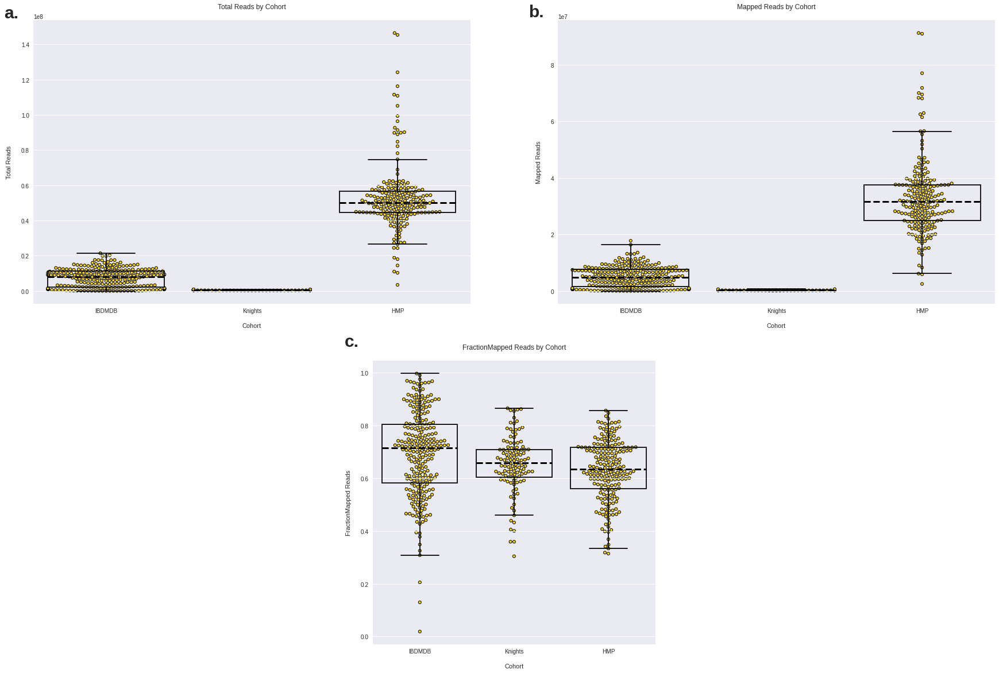

In [8]:
plt.figure(figsize=(30,20))
    
plt.subplot(2,2,1)
sns.swarmplot(x=read_stats.Cohort, y=read_stats.Total,
             edgecolor="k", color="gold", linewidth=1, zorder=0)

sns.boxplot(x=read_stats.Cohort, y=read_stats.Total, fliersize=0,
            boxprops={"facecolor":"k", 'color':'none', "zorder":2, "edgecolor":"k"},\
            medianprops={"color":'k', "linestyle":'dashed', "linewidth":3, "zorder":2},\
            flierprops={"markerfacecolor":"None", "marker":"o", "zorder":2, "color":"red"},\
           whiskerprops={"zorder":2, "color":"black"},\
           capprops={"color":"black", "zorder":2})

plt.title("Total Reads by Cohort\n")
plt.ylabel("Total Reads\n")
plt.xlabel("\nCohort")

plt.text(x=-0.7, y=1.55e8, s="a.", weight='bold', size=30)

plt.subplot(2,2,2)
sns.swarmplot(x=read_stats.Cohort, y=read_stats.Mapped,
             edgecolor="k", color="gold", linewidth=1, zorder=0)

sns.boxplot(x=read_stats.Cohort, y=read_stats.Mapped, fliersize=0,
            boxprops={"facecolor":"k", 'color':'none', "zorder":2, "edgecolor":"k"},\
            medianprops={"color":'k', "linestyle":'dashed', "linewidth":3, "zorder":2},\
            flierprops={"markerfacecolor":"None", "marker":"o", "zorder":2, "color":"red"},\
           whiskerprops={"zorder":2, "color":"black"},\
           capprops={"color":"black", "zorder":2})

plt.title("Mapped Reads by Cohort\n")
plt.ylabel("Mapped Reads\n")
plt.xlabel("\nCohort")

plt.text(x=-0.7, y=9.7e7, s="b.", weight='bold', size=30)

plt.subplot(2,3,5)
sns.swarmplot(x=read_stats.Cohort, y=read_stats.FractionMapped,
             edgecolor="k", color="gold", linewidth=1, zorder=0)

sns.boxplot(x=read_stats.Cohort, y=read_stats.FractionMapped, fliersize=0,
            boxprops={"facecolor":"k", 'color':'none', "zorder":2, "edgecolor":"k"},\
            medianprops={"color":'k', "linestyle":'dashed', "linewidth":3, "zorder":2},\
            flierprops={"markerfacecolor":"None", "marker":"o", "zorder":2, "color":"red"},\
           whiskerprops={"zorder":2, "color":"black"},\
           capprops={"color":"black", "zorder":2})

plt.title("FractionMapped Reads by Cohort\n")
plt.ylabel("FractionMapped Reads\n")
plt.xlabel("\nCohort")


plt.text(x=-0.8, y=1.1, s="c.", weight='bold', size=30)
# plt.savefig("../Fronteirs/Images/desc-stats-composite.tiff",
#            dpi=300, bbox_inches='tight')

## Diversity analysis
- Alpha-diversity was calculated using Shannon entropy (H)
    - $H = - \sum\limits_{i=1}^{n} p_i \times log_2(p_i)$
        - $p_i$ = proportion of species _i_ within sample
        - _n_ = number of species within sample     

In [9]:
def ShannonEntropy(df):
    """
    Function to return Shannon Entropy values for entire DF as a list
    
    Parameters
    ----------
    df: Dataframe object with sample names as the index and bacterial species as the columns
    
    Returns
    -------
    List containing Shannon entropy values
    """
    
    # Select only numeric values
    wdf = df.select_dtypes("float64").replace(0, np.nan).copy()
    
    # Create a list of the Shannon entropies
    SE = [-1 * np.sum((wdf.loc[x] * np.log2(wdf.loc[x]))) for x in wdf.index]
    
    return SE

In [10]:
# Import the raw relative abundances
rra = pd.read_csv("./DataFiles/raw-relative-abundances.csv", index_col="SampleName")

rra["Cohort"] = rra.apply(lambda x:"Healthy-1" if "SRS" in x.name \
                         else ("Healthy-2" if "_" in x.name else "IBDMDB"), axis=1)

# Add in the ShannonEntropy values
rra["ShannonEntropy"] = ShannonEntropy(rra)

read_stats = read_stats.join(rra["ShannonEntropy"])

# Split up the groups to make comparisons easier to read
ibd_se = rra[(rra.diagnosis == "UC") | (rra.diagnosis == "CD")].ShannonEntropy # IBD Shannon entropies

nibd_se = rra[rra.diagnosis == "non-IBD"].ShannonEntropy # non-IBD Shannon entropies

h1_se = rra[rra.diagnosis == "Healthy-1"].ShannonEntropy # Healthy-1 cohort Shannon entropies
h2_se = rra[rra.diagnosis == "Healthy-2"].ShannonEntropy # Healthy-2 cohort Shannon entropies

In [11]:
# Compare the different groups to each other
print("\nCompare IBD to non-IBD")
print(stats.mannwhitneyu(ibd_se, nibd_se))

print("\nCompare IBD to Healthy-1")
print(stats.mannwhitneyu(ibd_se, h1_se))

print("\nCompare IBD to Healthy-2")
print(stats.mannwhitneyu(ibd_se, h2_se))

print("\nCompare non-IBD to Healthy-1")
print(stats.mannwhitneyu(nibd_se, h1_se))

print("\nCompare non-IBD to Healthy-2")
print(stats.mannwhitneyu(nibd_se, h2_se))


Compare IBD to non-IBD
MannwhitneyuResult(statistic=4326.0, pvalue=0.050104572456378456)

Compare IBD to Healthy-1
MannwhitneyuResult(statistic=2044.0, pvalue=8.728465705811876e-57)

Compare IBD to Healthy-2
MannwhitneyuResult(statistic=0.0, pvalue=4.055849522105681e-50)

Compare non-IBD to Healthy-1
MannwhitneyuResult(statistic=469.0, pvalue=3.9709394132849974e-23)

Compare non-IBD to Healthy-2
MannwhitneyuResult(statistic=0.0, pvalue=2.5783946120301664e-24)


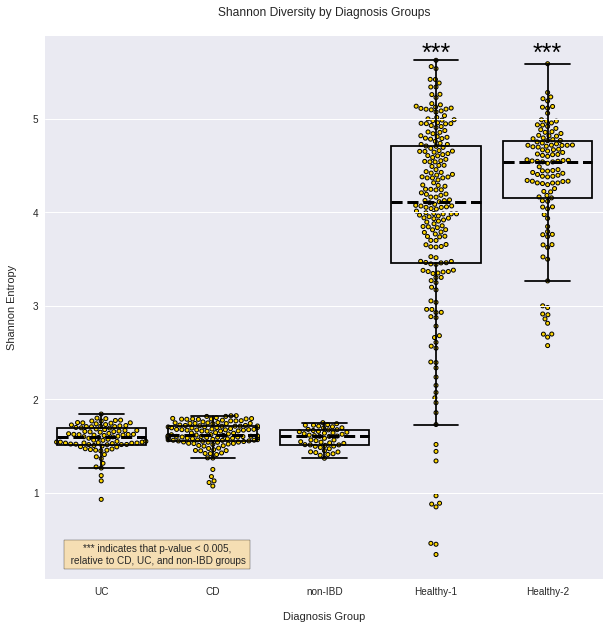

In [12]:
plt.figure(figsize=(10,10))

sns.swarmplot(x=rra.diagnosis, y=rra.ShannonEntropy,
             edgecolor="k", color="gold", linewidth=1, zorder=0, size=4)

sns.boxplot(x=rra.diagnosis, y=rra.ShannonEntropy, fliersize=0,
            boxprops={"facecolor":"k", 'color':'none', "zorder":2, "edgecolor":"k"},\
            medianprops={"color":'k', "linestyle":'dashed', "linewidth":3, "zorder":2},\
            flierprops={"markerfacecolor":"None", "marker":"o", "zorder":2, "color":"red"},\
           whiskerprops={"zorder":2, "color":"black"},\
           capprops={"color":"black", "zorder":2})

plt.annotate(s="***", xy=(3,5.7), color='k', 
             size=25, zorder=3, ha='center', va='center')

plt.annotate(s="***", xy=(4,5.7), color='k', 
             size=25, zorder=3, ha='center', va='center')

plt.title("Shannon Diversity by Diagnosis Groups\n")
plt.ylabel("Shannon Entropy\n")
plt.xlabel("\nDiagnosis Group")

plt.text(x=0.5, y=0.25, s="*** indicates that p-value < 0.005,\n relative to CD, UC, and non-IBD groups",
        bbox=dict(facecolor="wheat"),
        ha='center')


# plt.savefig("../Fronteirs/Images/ShannonDiversity.tiff", dpi=300)
plt.show()

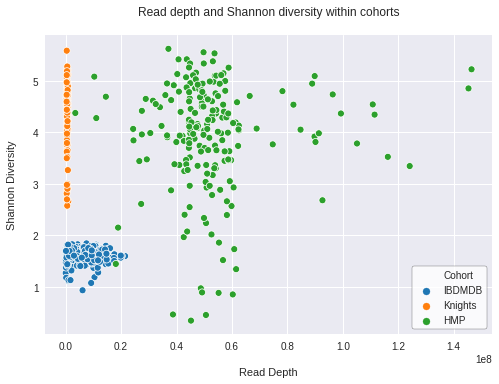

In [13]:
sns.scatterplot(read_stats.Total, read_stats.ShannonEntropy, hue=read_stats.Cohort)

plt.title("Read depth and Shannon diversity within cohorts\n")
plt.xlabel("\nRead Depth")
plt.ylabel("Shannon Diversity\n")

plt.legend(frameon=True, facecolor='white', edgecolor='k')

# plt.savefig("../Fronteirs/Images/alpha-diversity-read-depth-cohorts.tiff", dpi=300, bbox_inches='tight')

In [14]:
h1_se = rra[rra.Cohort == "Healthy-1"].ShannonEntropy
h2_se = rra[rra.Cohort == "Healthy-1"].ShannonEntropy
ibdmdb_se = rra[rra.Cohort == "IBDMDB"].ShannonEntropy


print("\nCompare IBDMDB to Healthy-1")
print(stats.mannwhitneyu(ibdmdb_se, h1_se))

print("\nCompare IBDMDB to Healthy-2")
print(stats.mannwhitneyu(ibdmdb_se, h2_se))

print("\nCompare Healthy-1 to Healthy-2")
print(stats.mannwhitneyu(h1_se, h2_se))


Compare IBDMDB to Healthy-1
MannwhitneyuResult(statistic=2513.0, pvalue=1.5054944151318413e-62)

Compare IBDMDB to Healthy-2
MannwhitneyuResult(statistic=2513.0, pvalue=1.5054944151318413e-62)

Compare Healthy-1 to Healthy-2
MannwhitneyuResult(statistic=20604.5, pvalue=0.4998312742412452)


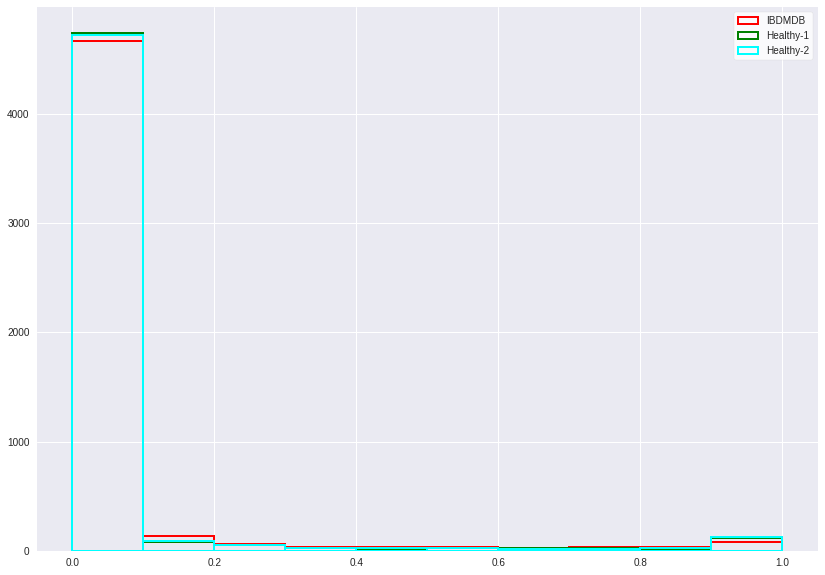

In [15]:
# Draw out the prevalence graphs

# Set specific colors for each cohort
cs = {"IBDMDB":"red",
     "Healthy-1": "green",
     "Healthy-2": "cyan"}

plt.figure(figsize=(14,10))

for c in rra.Cohort.unique():
    prev = rra[rra.Cohort == c].select_dtypes("float64").T.copy()
    prev["Prevalence"] = prev.apply(lambda x:len(x[x > 0])/len(x), axis=1)
    
    plt.hist(prev.Prevalence, label=c,
            facecolor="none", edgecolor=cs[c],
            linewidth=2)
    
plt.legend(facecolor='white', frameon=True)

# plt.savefig("../Fronteirs/Images/PrevalenceGraphs.tiff", dpi=300)
plt.show()

## Identifying important features

- Random Forest Classifier was used to identify important features
    - Important features are defined as features with a feature importance that is higher and significantly different than a random noise column
    
    <br>
- **Framework**
    1. A Gaussian distribution is modeled using the given data
    2. A random noise column is created by randomly picking from the Gaussian in the previous step
        * For each iteration, a new random noise column is created
    3. Bacterial species with mean feature importances higher than the random noise were retained
        * This is due to Mann-Whitney U test only designating whether two samples belong to different distributions; this allows us to determine samples that are higher and significntly different rather than just different which may include species with lower importance
    4. The retained species were then compared to the random column via a Mann-Whitney U (MWU) test
    5. The Benjamini-Hochberg multi-test correction was then performed on the MWU p-values and species with q-value (multi-test corrected p-value) < 0.05 were retained as the important species

In [16]:
def RFC_FI(trans_df, n, top_model_name, save, label, top_n=20, out=False, dpi=200, alpha=0.05):
    """
    Function to run a random forest classifier on transformed data n times and find the feature importances
    
    Paramters
    ---------
    trans_df: Dataframe containing transformed data
    n: Integer specifying how many times to re-run the classifier
    top_model_name: String specifying name to save the top-performing model as (without suffix)
    top_n: Integer specifying the top-n feature importances to show
    save: Boolean specifying whether to save the image or not
    label: Column to use to label the data
    out: String to save image as
    dpi: Integer specifying dpi of saved image
    alpha: The alpha level for determining if a feature is important
    
    Returns
    -------
    F-1 Scores for each run as global object stored as totals
    Image for top-n feature importances
    DF containing the feature importance of the important features
    
    """
    
    from sklearn.preprocessing import LabelEncoder
    from collections import defaultdict
    from sklearn.model_selection import train_test_split
    from sklearn.ensemble import RandomForestClassifier as rfc
    import datetime as dt
    import random
    from scipy.stats import mannwhitneyu as MWU
    import statsmodels.stats.multitest


    global d, edf
    d = defaultdict(LabelEncoder)
    edf = trans_df.dropna().apply(lambda x: d[x.name].fit_transform(x)) #Encoded DF

    x = edf.drop(label, axis=1)
#     .select_dtypes("float64")
    y = trans_df.dropna()[label].values

    # Create values that are normally distributed with the mean and SD of the data we have and add them in
    dist_mean = np.mean(x.apply(lambda x:x.mean()))
    dist_sd = np.std(x.apply(lambda x:x.std()))
    x["random"] = [random.gauss(mu=dist_mean, sigma=dist_sd) for x in range(len(x))]


    global xtest, ytest
    xtrain, xtest, ytrain, ytest = train_test_split(x,y,test_size=0.3)

    # Store accuracies
    global totals
    totals = {0:0}

    runs = 0

    #START LOOP

    print("Starting RFC\n")

    time0 = time.time()

    for i in range(n):
        runs +=1
        time1 = time.time()

        seed = dt.datetime.now().microsecond
        rf = rfc(n_estimators=100, random_state=seed)
        rf.fit(xtrain, ytrain)
        predicts = rf.predict(xtest)

        s = round(rf.score(xtest, ytest),4)

        if s > max(totals.values()) :
            pickle.dump(rf, open("DataFiles/" + top_model_name + '.sav', 'wb'))

        totals[i] = s

        print(" Run {} of {} Completed -- Score = {} -- TimeForLoop = {} seconds".format(
            runs, n, s, round((time.time() - time1),4)), end="\r")

        #Create a dataframe that houses the feature importances
        global all_imps
        imps = pd.DataFrame(rf.feature_importances_, columns=[f"Run{runs}"], index=xtrain.columns)

        if runs == 1:
            all_imps = imps
        else:
            all_imps[f"Run{runs}"] = imps[f"Run{runs}"]

    #END LOOP
    end_time = time.time() - time0
    if end_time > 60:
        end_time_stream = f"{round(end_time/60,2)} mins"
    else:
        end_time_stream = f"{end_time} seconds"

#     print("\n\nRFC complete in {}. Top model saved as '{}.sav'.".format(round(end_time_stream, 2), 
#                                                                               top_model_name))

    # Examine the found important features
#     global important_features_dict, important_features, sig_imps, mwu_results
    global important_features_dict
    important_features_dict = dict(all_imps.apply(lambda x:(round(x.mean(), 4), round(x.std(), 4)) \
                   if x.mean() >= all_imps.loc["random"].mean() \
                   else np.nan, axis=1).dropna())

    
    important_features = [x for x in important_features_dict.keys() if x != "random"]
    
    mwu_results = {} # Feature: P-val
    for feature in important_features:
        p_val = MWU(x=all_imps.T[feature], y=all_imps.T["random"])[1]
        mwu_results[feature] = [all_imps.T[feature].mean(), p_val]
    
    sig_imps = [x for x in mwu_results.keys() if mwu_results[x][1] < alpha]
    
    print(f"\n{len(sig_imps)} important features were found\n")
    
    # Make a DF out of the importances and analysis
    imp_analysis = pd.DataFrame.from_dict(mwu_results, orient='index', 
                                          columns = ["Importance", "P-val"])
    
    # Perform FDR correction
    if len(important_features) > 20:
        imp_analysis["Q-val"] = multitest.multipletests(imp_analysis["P-val"].values, 
                                                    method="fdr_bh")[1]
        
        imp_analysis = imp_analysis[imp_analysis["Q-val"] < alpha]
        
    else:
        imp_analysis = imp_analysis[imp_analysis["P-val"] < alpha]
        

    #Find feature importances
    global rf1
    rf1 = pickle.load(open('./DataFiles/' + top_model_name+'.sav', 'rb')) #Load the highest performing classifier
    rf1.fit(xtrain, ytrain)
    global predicts1
    predicts1 = rf1.predict(xtest)
    
    global class_report
    class_report = classification_report(ytest, predicts1)
    
    print(class_report)
    
    print(f"Random column mean: {all_imps.loc['random'].mean()}")
    return imp_analysis

In [17]:
def FindMisses(xtest, ytest, model):
    """
    Function to find and visualize missclassifications by the RFC
    
    Parameters
    ----------
    xtest: The testing data from the train-test split
    ytest: The labels for testing set from the train-test split
    model: The model object
    
    Returns
    -------
    Graph demonstrating the missclassifications
    """
    
    predicts = model.predict(xtest)

    pred_acc = {} # (Right, Wrong):count
    tot = len(ytest)
    cnt = 0

    for i,j in zip(ytest, predicts):
        if i != j:
            key = tuple(sorted(list((i,j))))
    #         print(f"Wrong prediction: {i} mispredicted as {j}")
            cnt += 1
            if key in pred_acc.keys():
                pred_acc[key] += 1
            else:
                pred_acc[key] = 1

    print(f"{cnt}/{tot} total mistakes")

    pred_acc = pd.DataFrame().from_dict(pred_acc, orient='index', 
                                        columns=["Count"]).sort_values(by="Count",
                                                                       ascending=False)
    pred_acc["MistakePercent"] = round(pred_acc.Count/cnt *100,2) 

    pred_acc.index = pred_acc.apply(lambda x:str(x.name).strip("()").strip("''").replace("', '", " <--> "), 
                                    axis=1)

    pred_acc.index.name = "Misclassification"

    display(pred_acc)
    print(f"Sum of Percents: {round(pred_acc.MistakePercent.sum(),1)}")

    # Graph the mistakes
    plt.bar(x=pred_acc.index, height=pred_acc.MistakePercent,
           color='gold', edgecolor='k', linewidth=1)

    plt.xticks(rotation=45, ha='right')

    plt.title("RFC misclassifications\n")
    plt.ylabel("Percent of misclassifications (%)\n")
    plt.xlabel("\n\nMisclassifications")

    for n,i in enumerate(pred_acc.index, start=0):
        plt.text(x=n, 
                 y=pred_acc.loc[i, "MistakePercent"]-2,
                 s=f"n = {pred_acc.loc[i, 'Count']}",
                 bbox=dict(facecolor='w', edgecolor='k', boxstyle="round, pad=0.5"),
                 zorder=2, ha='center')

In [18]:
def FindF1(xtest, ytest, model):
    """
    Function to find the F1-scores for RFC classifier
    
    Parameters
    ----------
    xtest: Testing data from train-test split
    ytest: labels for testing set from the train-test split
    model: the model object
    
    Returns
    -------
    Dataframe containing the results for each label
    """

    predicts = model.predict(xtest)
    
    rdict = {}

    for l in set(ytest):
        tp = sum([1 for t,p in zip(ytest,predicts) if t == p and t == l]) # t:truth -- p:predict -- l:label
        fp = sum([1 for t,p in zip(ytest,predicts) if t != p and p == l])
        fn = sum([1 for t,p in zip(ytest,predicts) if t != p and t == l])

        precision = round(tp/(tp+fp),3)
        recall = round(tp/(tp+fn),3)
        f1 = round(2/(precision**-1 + recall**-1),3)

        rdict[l] = [precision, recall, f1]
    

    return pd.DataFrame.from_dict(rdict, orient='index',
                      columns=["Preicions", "Recall", "F1-score"])

In [20]:
mdf = df.join(dfm[["sex", "age", "UniqID"]]) # meta-data added to DF
mdf["diagnosis"] = mdf.diagnosis.apply(lambda x: "IBD" if len(x) == 2 else x)

print(mdf.diagnosis.value_counts())
mdf.head()

Healthy    312
IBD        208
nonIBD      49
Name: diagnosis, dtype: int64


,Absiella_dolichum,Acetivibrio_ethanolgignens,Agathobaculum_desmolans,Alistipes_finegoldii,Alistipes_obesi,Alistipes_putredinis,Alistipes_senegalensis,Alistipes_shahii,Alistipes_sp_MarseilleP5997,Alistipes_timonensis,...,Eubacterium_siraeum,Intestinibacter_bartlettii,Lachnoclostridium_sp_YL32,Sellimonas_intestinalis,diagnosis,Dysbiotic_Status,Cohort,sex,age,UniqID
SampleName,,,,,,,,,,,,,,,,,,,,,
SRS011061,-0.631394,-1.293296,-1.446153,5.275120,3.671911,5.459929,1.599786,5.141250,0.750905,-0.053659,...,1.234433,-13.844712,-13.844712,-13.844712,Healthy,False,Healthy-1,Female,26.0,vdph
SRS011084,-0.920108,-1.859534,-1.628925,4.854152,3.247574,5.301879,1.256516,4.101268,-1.072989,1.270699,...,-2.129700,-15.370990,-3.585730,-3.526843,Healthy,False,Healthy-1,Male,26.0,jkom
SRS011134,-1.431045,-1.440924,-1.009247,3.643668,3.297067,4.702711,2.408614,3.618708,-0.022844,-0.185953,...,2.521996,-3.879068,-3.813587,-3.831098,Healthy,False,Healthy-1,Male,26.0,ejuk
SRS011239,-1.636580,1.919993,-1.565493,2.349998,3.829479,5.902990,2.366692,4.279826,0.080371,-0.042901,...,-0.440950,-3.232589,-15.016807,-1.552899,Healthy,False,Healthy-1,Female,26.0,bstj
SRS011271,-1.136696,-0.855189,-1.289621,3.618635,1.910095,4.651790,1.132751,2.256649,0.321035,-1.191239,...,-2.415688,-1.216055,-2.587554,-3.124868,Healthy,False,Healthy-1,Male,26.0,pvmy


In [21]:
mdf.shape

(569, 144)

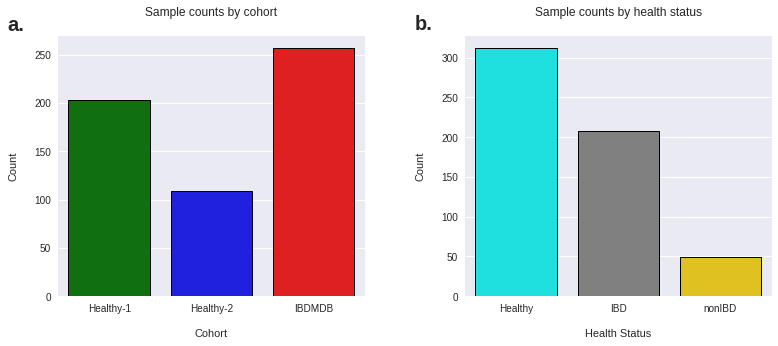

In [22]:
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
sns.countplot(mdf.Cohort, palette=["green", "blue", "red"],
             linewidth=1, edgecolor='k')

plt.title("Sample counts by cohort\n")
plt.xlabel("\nCohort")
plt.ylabel("Count\n")

plt.text(x=-1, y=275, s="a.", 
         size=20, weight='bold')

plt.subplot(1,2,2)
sns.countplot(mdf.diagnosis, palette=["cyan", "gray", "gold"],
             linewidth=1, edgecolor='k')

plt.title("Sample counts by health status\n")
plt.xlabel("\nHealth Status")
plt.ylabel("Count\n")

plt.text(x=-1, y=335, s="b.", 
         size=20, weight='bold')

plt.tight_layout(pad=5)
# plt.savefig("../Fronteirs/Images/count-plot-composite.tiff", dpi=300)

### Demonstrate overlap errors

- Shows how similar CD and UC are

,Preicions,Recall,F1-score
CD,0.738,0.775,0.756
Healthy,0.870,1.000,0.930
nonIBD,0.667,0.308,0.421
UC,0.750,0.333,0.461


30/171 total mistakes


,Count,MistakePercent
Misclassification,,
CD <--> UC,10,33.33
Healthy <--> nonIBD,6,20.00
CD <--> nonIBD,5,16.67
CD <--> Healthy,5,16.67
Healthy <--> UC,4,13.33


Sum of Percents: 100.0


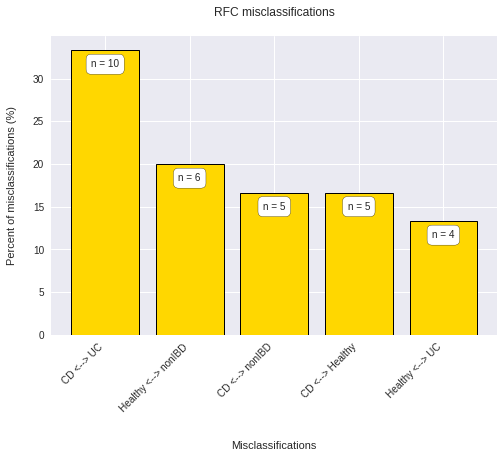

In [23]:
mdf2 = df.join(dfm[["sex", "age", "UniqID"]]).copy()
mdf2["DG"] = mdf2.apply(lambda x:"Healthy" if "SRS" in x.name \
                else ("Healthy" if "_" in x.name \
                     else x["diagnosis"]), axis=1)

# Results and model are stored for reproducibility and ease
"""
# Identify features that are significantly more important than 
imps = RFC_FI(mdf2.drop(["Cohort","diagnosis"], axis=1), 
                       n=100, top_model_name="overlaps", save=False, label="DG")

# Save totals to a csv
pd.DataFrame.from_dict(totals, orient='index', columns=["F1-score"]).to_csv("DataFiles/overlap_totals.csv")

# Save the importances
imps.sort_values(by="Importance", ascending=False).to_csv("DataFiles/overlap_imps.csv")

# Save the xtest and ytest for future use if wanted
ytest.tofile("overlap_ytest.csv", sep=",")
xtest.to_csv("overlap_xtest.csv", sep=",")
"""

# Classification report and RFC results are also printed out below
"""
77 important features were found

              precision    recall  f1-score   support

          CD       0.74      0.78      0.76        40
     Healthy       0.87      1.00      0.93       100
          UC       0.75      0.33      0.46        18
      nonIBD       0.67      0.31      0.42        13

    accuracy                           0.82       171
   macro avg       0.76      0.60      0.64       171
weighted avg       0.81      0.82      0.80       171

Random column mean: 0.004782217460937337
"""

xtest0 = pd.read_csv("overlap_xtest.csv", index_col="SampleName")
ytest0 = [x.split(".")[0].strip("'") for x in pd.read_csv("overlap_ytest.csv").columns]
rf_model0 = pickle.load(open("DataFiles/overlaps.sav", 'rb'))


display(FindF1(xtest0, ytest0, rf_model0))
FindMisses(xtest0, ytest0, rf_model0)

# plt.savefig("../Fronteirs/Images/rfc-missclass-uc-cd.tiff", dpi=300,
#            bbox_inches='tight')

30/171 total mistakes


,Count,MistakePercent
Misclassification,,
CD <--> UC,10,33.33
Healthy <--> nonIBD,6,20.00
CD <--> nonIBD,5,16.67
CD <--> Healthy,5,16.67
Healthy <--> UC,4,13.33


Sum of Percents: 100.0


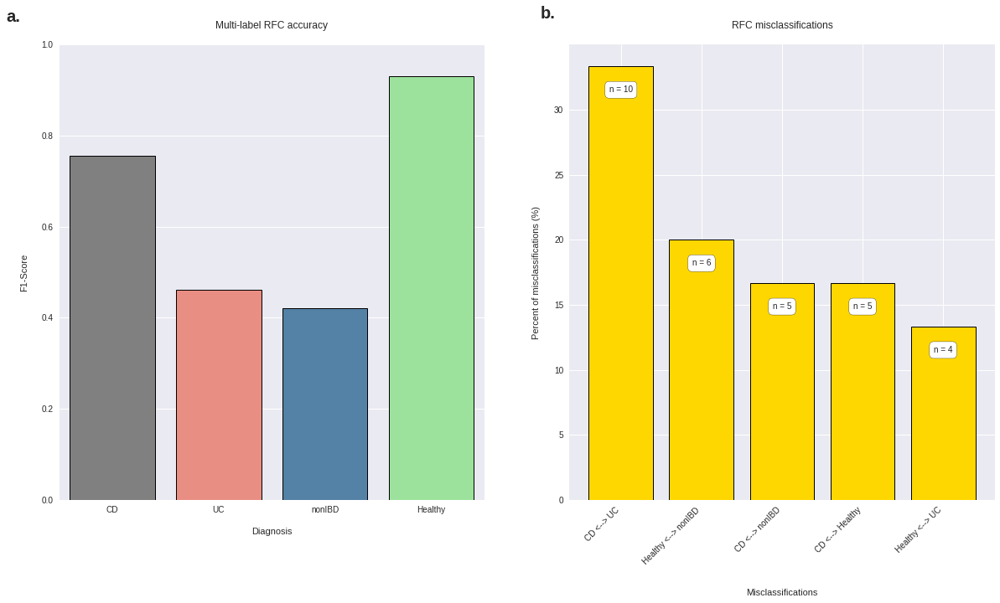

In [24]:
tot_res = FindF1(xtest0, ytest0, rf_model0)

plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
sns.barplot(x=tot_res.index, y=tot_res["F1-score"],
           order=["CD", "UC", "nonIBD", "Healthy"],
           palette=["gray", "salmon", "steelblue", "lightgreen"],
           edgecolor='k', linewidth=1)

plt.title("Multi-label RFC accuracy\n")
plt.ylabel("F1-Score\n")
plt.xlabel("\nDiagnosis")

plt.ylim(0,1)

plt.text(x=-1, y=1.05, s="a.",
        weight='bold', fontsize=20)

plt.subplot(1,2,2)

FindMisses(xtest0, ytest0, rf_model0)
plt.text(x=-1, y=37, s="b.",
        weight='bold', fontsize=20)

plt.savefig("../Fronteirs/Images/cd-uc-rfc-composite.tiff", bbox_inches='tight', dpi=300)

## Identify the important bacterial species and metadata

In [25]:
# Does not need to be run again to save time
"""
# Identify features that are significantly more important than 
imps = RFC_FI(mdf.drop("Cohort", axis=1), 
                       n=100, top_model_name="all_nondys_diagnosis", save=False, label="diagnosis")

# Save totals to a csv
pd.DataFrame.from_dict(totals, orient='index', columns=["F1-score"]).to_csv("DataFiles/all_nondys_diagnosis_totals.csv")

# Save the importances
imps.sort_values(by="Importance", ascending=False).to_csv("DataFiles/all_nondys_diagnosis_imps.csv")

# Save the xtest and ytest for future use if needed
ytest.tofile("ytest.csv", sep=",")
xtest.to_csv("xtest.csv", sep=",")
"""

# The output from the RFC_FI function are stored below

# Output of the RFC_FI function run
"""
122 important features were found

                precision    recall  f1-score   support

     Healthy       0.91      1.00      0.95        96
         IBD       0.87      0.90      0.89        60
      nonIBD       1.00      0.20      0.33        15

    accuracy                           0.89       171
   macro avg       0.93      0.70      0.72       171
weighted avg       0.90      0.89      0.87       171

Random column mean: 0.003088839677037543
"""

# Load the completed results
imps = pd.read_csv("DataFiles/all_nondys_diagnosis_imps.csv", index_col="Unnamed: 0")
scores = pd.read_csv("DataFiles/all_nondys_diagnosis_totals.csv", index_col="Unnamed: 0")

xtest = pd.read_csv("xtest.csv", index_col="SampleName")
ytest = [x.split(".")[0].strip("'") for x in pd.read_csv("ytest.csv").columns]
rf_model = pickle.load(open("DataFiles/all_nondys_diagnosis.sav", 'rb')) #Load the highest performing classifier


print(scores["F1-score"].mean())

display(imps.sort_values(by="Importance", ascending=False).head(10))

# Look at how important the UniqID column is
imps["Rank"] = imps.sort_values(by="Importance", ascending=False).reset_index().index.values + 1

# Print out where the metadata of interest are ranked in importance
for i in ["age", "sex", "UniqID"]:
    try:
        print(f"Rank of {i} column based on importance: {imps.loc[i, 'Rank']}/{imps.Rank.max()}")
    except:
        print(f"{i} is not ranked")

0.8797470000000002


,Importance,P-val,Q-val
age,0.078372,1.281072e-34,6.985751e-34
Blautia_hydrogenotrophica,0.029532,1.281072e-34,6.985751e-34
Gordonibacter_pamelaeae,0.027259,1.281072e-34,6.985751e-34
Lachnoclostridium_sp_YL32,0.026506,1.281072e-34,6.985751e-34
Faecalibacterium_prausnitzii,0.024272,1.281072e-34,6.985751e-34
Clostridium_bolteae,0.022970,1.281072e-34,6.985751e-34
Clostridium_citroniae,0.021517,1.281072e-34,6.985751e-34
Intestinibacter_bartlettii,0.019218,1.281072e-34,6.985751e-34
Clostridium_symbiosum,0.017535,1.281072e-34,6.985751e-34
Hungatella_hathewayi,0.015983,1.281072e-34,6.985751e-34


Rank of age column based on importance: 1/122
sex is not ranked
Rank of UniqID column based on importance: 99/122


18/171 total mistakes


,Count,MistakePercent
Misclassification,,
IBD <--> nonIBD,8,44.44
Healthy <--> IBD,7,38.89
Healthy <--> nonIBD,3,16.67


Sum of Percents: 100.0


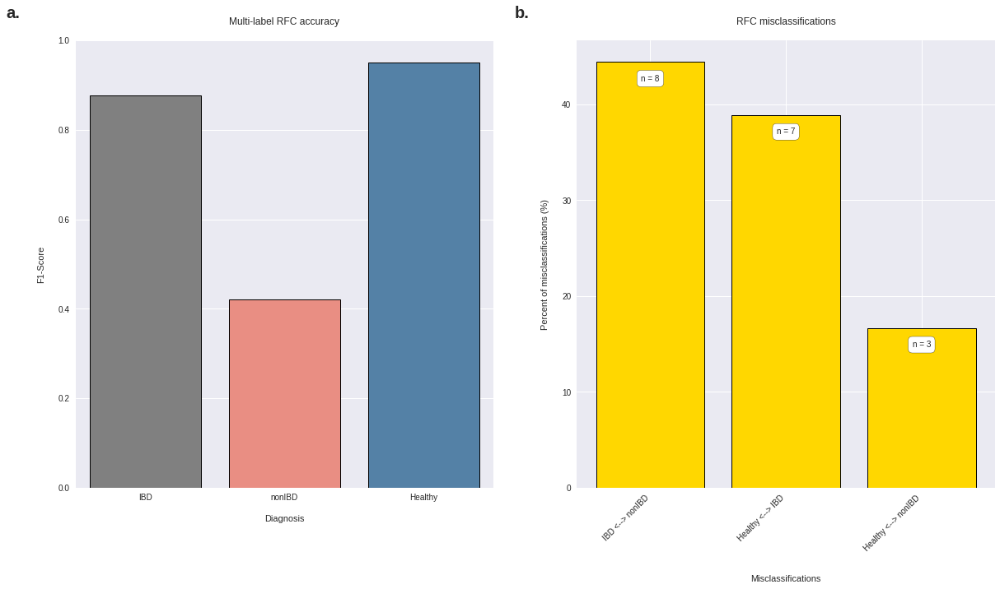

In [26]:
rf_res = FindF1(xtest, ytest, rf_model)

plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
sns.barplot(x=rf_res.index, y=rf_res["F1-score"],
           order=["IBD", "nonIBD", "Healthy"],
           palette=["gray", "salmon", "steelblue", "lightgreen"],
           edgecolor='k', linewidth=1)

plt.title("Multi-label RFC accuracy\n")
plt.ylabel("F1-Score\n")
plt.xlabel("\nDiagnosis")

plt.ylim(0,1)

plt.text(x=-1, y=1.05, s="a.",
        weight='bold', fontsize=20)

plt.subplot(1,2,2)

FindMisses(xtest, ytest, rf_model)
plt.text(x=-1, y=49, s="b.",
        weight='bold', fontsize=20)

plt.savefig("../Fronteirs/Images/ibd-combo-rfc-composite.tiff", bbox_inches='tight', dpi=300)

In [27]:
rf_res["F1-score"].mean()

0.7496666666666667

## Differential abundance species analysis

In [28]:
def StatAnalysis(trans_df, label, group1, group2, alpha=0.05):
    """
    Function to find significant differences between the groups
    
    Determines if a sample is normally distributed and then conductes the appropriate pair-wise test.
    Mann-Whitney U test for non-parametric.
    Two-Sample T-test for parametric data.
    
    Parameters
    ----------
    df: Dataframe containing the transformed data for both groups
    group1: name of group1 as it appears in the dataframe
    group2: name of group2 as it appears in the dataframe
    alpha: cut-off for p-value
    
    Returns
    -------
    DF containing the results
    """
    
    df = trans_df.copy()
    
    dct = {} #To store information and turn into DF at the end
    #dct[i] = group1_norm, group2_norm, pval
    
    #Test for normality using D'Agostino Omnibus test
    for i in df.select_dtypes("float64"):
        
#         try:

        if stats.normaltest(df[i][df[label] == group1])[1] > alpha:
            n1 = "Parametric"
        else:
            n1 = "Non-parametric"

        if stats.normaltest(df[i][df[label] == group2])[1] > alpha:
            n2 = "Parametric"
        else:
            n2 = "Non-parametric"
                
#         except ValueError:
#             print(f"{i} did not have enough samples")
#             n1 = "Non-parametric"
#             n2 = "Non-parametric"
            
        
        #Perform correct pair-wise analysis
        if n1 == "Non-parametric" or n2 == "Non-parametric":
            try:
                pval = stats.mannwhitneyu(df[i][df[label] == group1].values,\
                                          df[i][df[label] == group2].values)[1]
            except ValueError:
                pval = int(1)
            
        else:
            pval = stats.ttest_ind(df[i][df[label] == group1].values,\
                                   df[i][df[label] == group2].values)[1]
            

        #Store the data
        dct[i] = [n1, n2,\
                  df[i][df[label] == group1].mean(), df[i][df[label] == group2].mean(),pval]
    
    norm1 = "{}_dist".format(group1)
    norm2 = "{}_dist".format(group2)
    mean1 = "{}_mean".format(group1)
    mean2 = "{}_mean".format(group2)
    
    
    #Create the analysis dataframe
    adf = pd.DataFrame.from_dict(dct, orient="index",\
                                 columns=[norm1, norm2, mean1, mean2, "P_value"])
    
    #Perform FDR correction
    adf["Q_value"] = multitest.multipletests(adf.P_value, method="fdr_bh")[1]
    
    print("Total features: {}".format(len(adf)))
    
    print("P < 0.05: {}"\
      .format(len(adf[adf.P_value < 0.05])))

    print("Q < 0.05: {}"\
      .format(len(adf[adf.Q_value < 0.05])))
    
    return adf.sort_values(by="Q_value", ascending=True)

In [29]:
def DiffViz(df, alpha=0.05, fold_diff_thresh=2, out=None, save=False, dpi=200, fc_df_out=False):
    """
    Function to calculate and visualize top-20 differences between the ILR-transformed data
    
    Paramters
    ---------
    df: Dataframe containing the statistical analysis
    alpha: q-value cut-off for significance
    diff_thresh: Absolute value for minimum difference
    title_label: String for image title
    out: String containing the image name
    save: Boolean for saving the image
    dpi: Integer specifiying the image DPI
    fc_df_out: Boolean to return the fold-change df
    
    Returns
    -------
    Image display (Top-n differencnes with q-val > alpha and diff > thresh)
    Saved image
    fc_df: fold-change DF containg only the significantly different Fold-Changes
    """
    
    wdf = df.copy() #working df
    diff_thresh = math.log(fold_diff_thresh)
            
    ######################Create the diffs (log fold-change)#####################################
    #1: find the rows containing the means
    rm = re.compile("_mean")
    mean_list = list(filter(rm.search,list(wdf.columns)))

    g1, g2 = mean_list #Store the groups into variables for easy use

    #2: Find the differences
    wdf["Diff"] = wdf.apply(lambda x:x[g1] - x[g2]\
                                     if x[g1]-x[g2] != 0\
                                     else 0, axis=1)
    
    wdf["abs"] = abs(wdf["Diff"])
    wdf.sort_values(by='abs', ascending=False, inplace=True)
    wdf.drop("abs", axis=1, inplace=True)
    
    fc_df = wdf[wdf.Q_value < alpha]
    
    ##################Create the fold-change graph##############################################
    mask1 = fc_df.Diff > diff_thresh #Higher in HMP -- Lower in IBD
    mask2 = fc_df.Diff < -1*diff_thresh #Lower in HMP -- Higher in IBD
    
    #Draw the graph labels
    name1 = g1.split("_")[0]
    name2 = g2.split("_")[0]
    
    plt.figure(figsize=(24,12))
    
    plot_len = len(fc_df[mask1].index) + len(fc_df[mask2].index) + 3 # Make this the length of the plot
    plt.xlim(-3, plot_len)
    plt.bar(fc_df.index[mask1], fc_df.Diff[mask1], color='green', 
            label=name1, edgecolor='black', linewidth=1)
    plt.bar(fc_df.index[mask2], fc_df.Diff[mask2], color='red', 
            label=name2, edgecolor='black', linewidth=1)
    
    
    plt.title(f"Log-ratio differences between {name1} and {name2} of at least {fold_diff_thresh}-fold difference\n", 
              size=20, weight='bold')
    plt.ylabel(r"Difference in Log-ratios (base $e$)"+"\n", size=22)
    
    #Remove the x-ticks
    plt.tick_params(axis='x', bottom=False, labelbottom=False)
    
    #Draw the labels and asterisks on the graph
    #Pos labels
    x = 0.2
    for i in fc_df[mask1].index:
        try:
            if i.split("_strain")[0].split("_")[-1] in i.split("_strain")[1] or i.split("_strain")[0].split("_")[-3] in i.split("_strain")[1]:
                plt.annotate(i.split("_strain")[0], xy=(x,-0.2), rotation=60, ha='right', va='top',\
                        color='k', size=15)
            else:
                plt.annotate(i, xy=(x,-0.1), rotation=60, ha='right', va='top',\
                    color='k', size=15)
                
        except IndexError:
            plt.annotate(i, xy=(x,-0.1), rotation=60, ha='right', va='top',\
                    color='k', size=15)
            
        
        #Add q-value asterisks
        q = fc_df.loc[i]["Q_value"]
        y = fc_df.loc[i]["Diff"]
        
        if q < 0.001:
            s = "***"
        elif q < 0.01:
            s = "**"
        else:
            s = "*"
        
        plt.annotate(s, xy=(x-0.2,y), ha='center', va='bottom', size=18)
        
        x+=1
        
        
    #Neg labels
    for i in fc_df[mask2].index:
        try:
            if i.split("_strain")[0].split("_")[-1] in i.split("_strain")[1] or i.split("_strain")[0].split("_")[-3] in i.split("_strain")[1]:
                plt.annotate(i.split("_strain")[0], xy=(x-0.5,0.2), rotation=60, ha='left', va='bottom',\
                        color='k', size=15)
            else:
                plt.annotate(i, xy=(x-0.5,0.1), rotation=60, ha='left', va='bottom',\
                    color='k', size=15)
                
        except IndexError:
            plt.annotate(i, xy=(x-0.5,0.1), rotation=60, ha='left', va='bottom',\
                    color='k', size=15)
        
        #Add q-value asterisks
        q = fc_df.loc[i]["Q_value"]
        y = fc_df.loc[i]["Diff"]
        
        if q < 0.001:
            s = "***"
        elif q < 0.01:
            s = "**"
        else:
            s = "*"
        
        plt.annotate(s, xy=(x-0.2,y-0.05), ha='center', va='top', size=18)
        
        x+=1
    
    
    # Label how many bacs are up, and how many are down
    xmin, xmax, ymin, ymax  = plt.axis()
    
    plt.text(x=len(fc_df[mask1].index)/2, y=ymax-0.5, s=f"{len(fc_df[mask1])} bacteria", 
             color='darkgreen', size=20, bbox={"facecolor":"white", "edgecolor":"k"})
    
    plt.text(x=len(fc_df[mask2].index), y=ymin+0.5, s=f"{len(fc_df[mask2])} bacteria", 
             color='maroon', size=20, bbox={"facecolor":"white", "edgecolor":"k"})
    
    #Add note explaining the q-value asterisks
    plt.text(x=xmin+2, y=ymin+0.5, s="""* indicates a q-value < 0.05
** indicates a q-value < 0.01
*** indicates a q-value < 0.001""", bbox={'facecolor':'wheat'}, size=20)
    
    #Set up the save-option
    plt.tight_layout()
    
    if save:
        if not out:
            print("Out name required if you wish to save image")
        else:
            print("Image saved as '{}'".format(out))
            plt.savefig(out, dpi=dpi)
    
    plt.xticks(size=15)
    plt.yticks(size=15)
    
    plt.legend(frameon=True, facecolor="white", edgecolor='k', 
              prop={"size":20}, ncol=2)
#     plt.show()
    
    if fc_df_out:
        return fc_df

In [30]:
cdf = df[list(imps.drop(["age", "UniqID"]).index)].copy()
cdf["diagnosis"] = df.apply(lambda x:"Healthy-1" if "SRS" in  x.name \
                                       else ("Healthy-2" if "_" in x.name \
                                             else ("IBD" if x["diagnosis"] != "nonIBD" \
                                                   else x["diagnosis"])), axis=1)

print(df.shape)
print(cdf.shape)
display(cdf.diagnosis.value_counts())

(569, 141)
(569, 121)


IBD          208
Healthy-1    203
Healthy-2    109
nonIBD        49
Name: diagnosis, dtype: int64

Total features: 120
P < 0.05: 64
Q < 0.05: 55


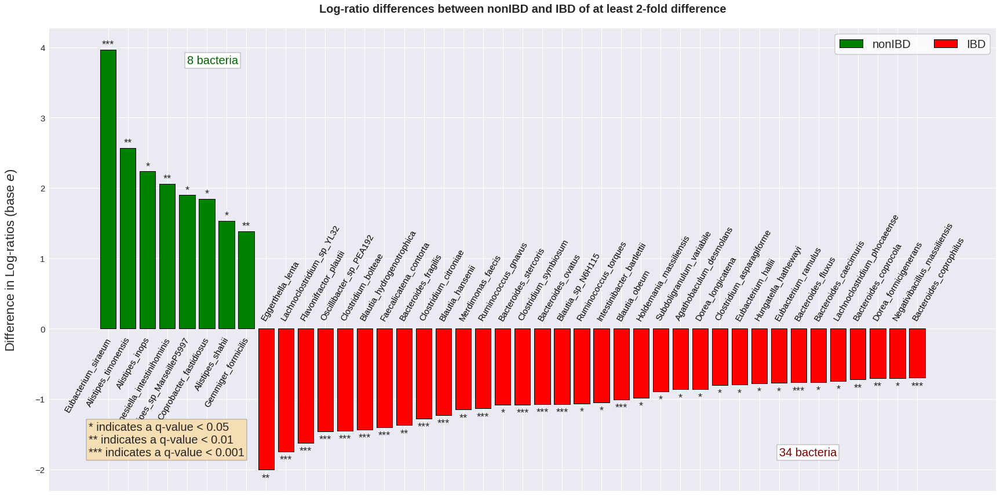

In [31]:
# Analyze the differential abundances of species between IBD and non-IBD
stat_ibdmdb = StatAnalysis(cdf, label="diagnosis", group1="nonIBD", group2="IBD")
DiffViz(stat_ibdmdb, fold_diff_thresh=2)

Total features: 120
P < 0.05: 98
Q < 0.05: 97


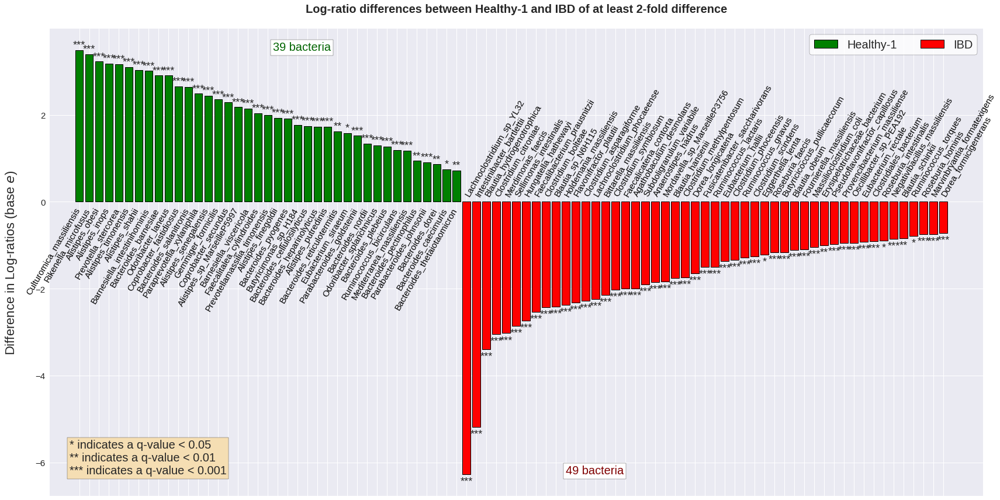

In [32]:
stat_ibd_healthy = StatAnalysis(cdf, label="diagnosis", group1="Healthy-1", group2="IBD")
DiffViz(stat_ibd_healthy, fold_diff_thresh=2)

Total features: 120
P < 0.05: 101
Q < 0.05: 99


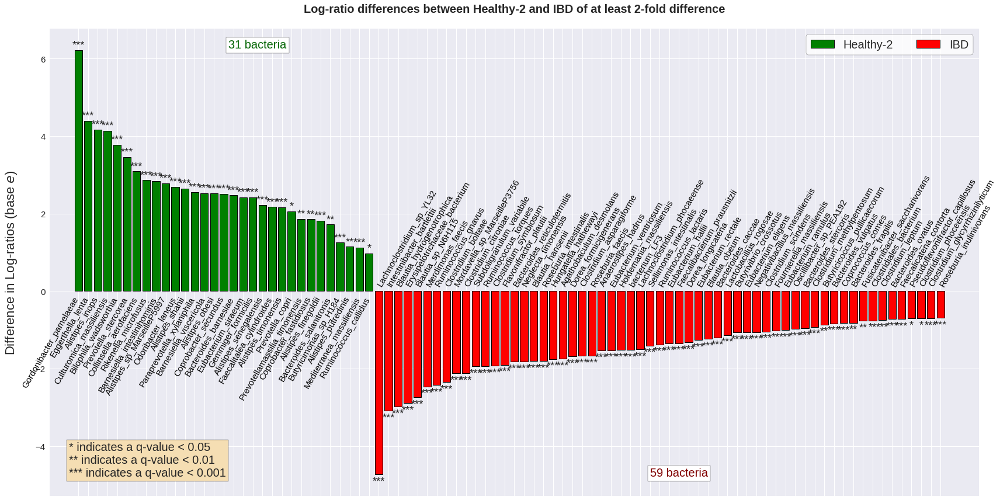

In [33]:
stat_ibd_kns = StatAnalysis(cdf, label="diagnosis", group1="Healthy-2", group2="IBD")
DiffViz(stat_ibd_kns, fold_diff_thresh=2)

In [34]:
# Average the 3 healthy groups (non-IBD, H1, H2) for ease of visualization
validated_bacs = [x for x in stat_ibdmdb[stat_ibdmdb.Q_value < 0.05].index \
 if x in stat_ibd_healthy[stat_ibd_healthy.Q_value < 0.05].index \
 and x in stat_ibd_kns[stat_ibd_kns.Q_value < 0.05].index]

print(f"{len(validated_bacs)}/{len(stat_ibdmdb)} bacteria were significantly different in all cohorts")


stat_ibd_others = stat_ibdmdb.loc[validated_bacs][["IBD_mean", "Q_value"]]

stat_ibd_others["nonIBD/Healthy_mean"] = (stat_ibd_kns.loc[validated_bacs, "Healthy-2_mean"] + \
        stat_ibd_healthy.loc[validated_bacs, "Healthy-1_mean"] + 
                stat_ibdmdb.loc[validated_bacs, "nonIBD_mean"]) / 3

46/120 bacteria were significantly different in all cohorts


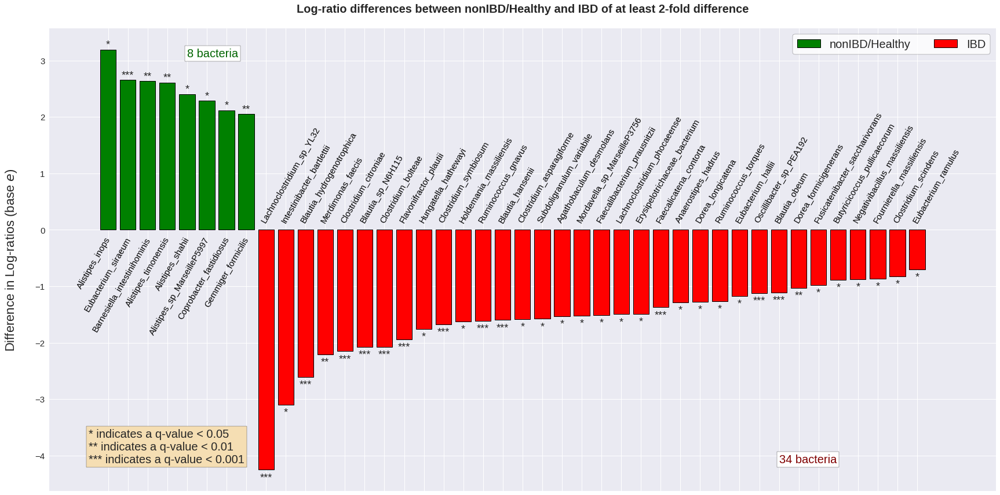

In [35]:
ibd_others_fc = DiffViz(stat_ibd_others[["nonIBD/Healthy_mean", "IBD_mean", "Q_value"]], fold_diff_thresh=2, 
        fc_df_out=True)

# plt.savefig("../Fronteirs/Images/ibd-diff-abundance.tiff", dpi=300, bbox_inches='tight')

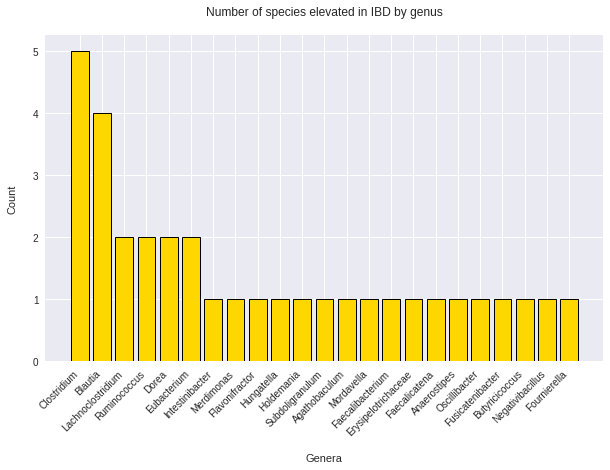

In [36]:
# Find the bacteria that are consistently elevated in IBD with fold-change >= 2
int_bacs = list(ibd_others_fc.apply(lambda x:x.name if x["IBD_mean"] > x["nonIBD/Healthy_mean"] \
                    and abs(x["Diff"]) >= 0.693 \
                    else np.nan, 
                    axis=1).dropna()) # Interesting bacteria

gen_counts = dict(Counter([x.split("_")[0] for x in int_bacs]).most_common())

plt.figure(figsize=(10,6))
plt.bar(x=gen_counts.keys(), height=gen_counts.values(), 
       color='gold', edgecolor='k', linewidth=1)

plt.title("Number of species elevated in IBD by genus\n")
plt.xlabel("\nGenera")
plt.ylabel("Count\n")

plt.xticks(rotation=45, ha='right')

# plt.savefig("../Fronteirs/Images/genera-counts-ibd-elevated.tiff", dpi=300, bbox_inches='tight')
plt.show()

In [37]:
# Get the taxonomic profiles relative abundance statuses
stat_ibd_others["Status"] = stat_ibd_others.apply(lambda x:"Elevated in IBD" \
                                                  if x["IBD_mean"] > x["nonIBD/Healthy_mean"] \
                                                 else "Elevated in Healthy", axis=1)

stat_ibd_others.Status.value_counts()

Elevated in IBD        37
Elevated in Healthy     9
Name: Status, dtype: int64

In [38]:
labels = stat_ibdmdb[["IBD_mean", "nonIBD_mean"]].join(stat_ibd_healthy["Healthy-1_mean"])\
.join(stat_ibd_kns["Healthy-2_mean"])
labels

,IBD_mean,nonIBD_mean,Healthy-1_mean,Healthy-2_mean
Faecalicatena_contorta,-1.137728,-2.540033,-3.138562,-1.855989
Blautia_hydrogenotrophica,0.855556,-0.576251,-2.543139,-2.126472
Flavonifractor_plautii,3.118436,1.496712,0.804097,1.217074
Clostridium_bolteae,2.217367,0.769134,-0.205407,-0.127259
Clostridium_citroniae,0.851851,-0.426464,-2.198494,-1.273096
...,...,...,...,...
Christensenella_minuta,-2.729177,-2.116039,-1.873554,-1.865160
Prevotellamassilia_timonensis,-1.535958,-1.015608,0.457718,0.328551
Coprobacter_secundus,-2.738946,-1.975425,-0.452578,-0.224953
Bilophila_wadsworthia,-3.067148,-2.137156,-2.491767,0.711576


In [39]:
labels["Status"] = stat_ibd_others.apply(lambda x:"Elevated in IBD" \
                                                  if x["IBD_mean"] > x["nonIBD/Healthy_mean"] \
                                                 else "Elevated in Healthy", axis=1)

# Differential abundance labels and colors
labels.fillna("Not significantly different", inplace=True)
labels["Color"] = labels.Status.apply(lambda x:"salmon" if "IBD" in x \
                                     else ("lightgreen" if "Healthy" in x \
                                          else "gold"))

labels.to_csv("./DataFiles/DiffAbundanceList.csv")

In [40]:
df["diagnosis"] = df.apply(lambda x: "IBD" if len(x["diagnosis"]) == 2 \
                                    else("Healthy-1" if "SRS" in x.name \
                                        else ("Healthy-2" if "_" in x.name \
                                             else x["diagnosis"])), axis=1)

df.diagnosis.value_counts()

IBD          208
Healthy-1    203
Healthy-2    109
nonIBD        49
Name: diagnosis, dtype: int64

In [41]:
tstat_ibdmdb = StatAnalysis(df, label="diagnosis", group1="nonIBD", group2="IBD")
tstat_ibd_healthy = StatAnalysis(df, label="diagnosis", group1="Healthy-1", group2="IBD")
tstat_ibd_kns = StatAnalysis(df, label="diagnosis", group1="Healthy-2", group2="IBD")

# Average the 3 healthy groups (non-IBD, H1, H2) for ease of visualization
tvalidated_bacs = [x for x in tstat_ibdmdb[tstat_ibdmdb.Q_value < 0.05].index \
 if x in tstat_ibd_healthy[tstat_ibd_healthy.Q_value < 0.05].index \
 and x in tstat_ibd_kns[tstat_ibd_kns.Q_value < 0.05].index]

print(f"\n{len(tvalidated_bacs)}/{len(tstat_ibdmdb)} bacteria were significantly different in all cohorts")

Total features: 138
P < 0.05: 72
Q < 0.05: 61
Total features: 138
P < 0.05: 105
Q < 0.05: 103
Total features: 138
P < 0.05: 116
Q < 0.05: 114

47/138 bacteria were significantly different in all cohorts


In [42]:
# Check if all validated bacteria using the important species were found in the total set
    # - To esnure that we did not reduce the FDR penalty inadvertantly
    
tstat_ibd_others = tstat_ibdmdb.loc[tvalidated_bacs][["IBD_mean", "Q_value"]]

tstat_ibd_others["nonIBD/Healthy_mean"] = (tstat_ibd_kns.loc[tvalidated_bacs, "Healthy-2_mean"] + \
        tstat_ibd_healthy.loc[tvalidated_bacs, "Healthy-1_mean"] + 
                tstat_ibdmdb.loc[tvalidated_bacs, "nonIBD_mean"]) / 3
    
# Create a list of the bacteria that are present in subset, but not the total
[x for x in validated_bacs if x not in tvalidated_bacs] # All important species are present 

[]

### Examine the proportion of the non-different bacteria by relative abunduance

In [43]:
def CheckTotalRelAbundances(target_label):
    """
    Function to check how much of the relative abundance is made up by bacteria with the specific diff abundance status
    
    Parameters
    ----------
    target_label: label given to species via differential abundance analysis
    
    Returns
    -------
    Print outs with the results for each diagnosis
    
    """
    for c in udf.diagnosis.unique():
        tot = sum(udf[udf.diagnosis == c].select_dtypes("float64").sum(axis=1))

        target_bacs = labels[labels.Status == target_label].index
        ttot = sum(udf[udf.diagnosis == c][target_bacs].sum(axis=1))

        perc = round((ttot/tot)*100, 2)

        print(f"{c}: Bacteria that are {target_label.lower()} comprise {perc}% of the relative abundance\n")

In [44]:
unt_df["Cohort"] = unt_df.apply(lambda x:"Healthy-1" if "SRS" in x.name \
         else ("Healthy-2" if "_" in x.name \
               else "IBDMDB"), axis=1)

dfm["Cohort"] = dfm.apply(lambda x:"Healthy-1" if "SRS" in x.name \
         else ("Healthy-2" if "_" in x.name \
               else "IBDMDB"), axis=1)

dfm.drop([x for x in dfm.index if x not in unt_df.index], inplace=True)
unt_df.drop([x for x in unt_df.index if x not in dfm.index], inplace=True)

udf = unt_df.join(dfm.diagnosis)

udf["diagnosis"] = udf.apply(lambda x: x["Cohort"] if x["diagnosis"] == "Healthy" \
                            else ("IBD" if len(x["diagnosis"]) == 2 \
                                               else x["diagnosis"]), axis=1)
udf.diagnosis.value_counts()

Healthy-1    203
IBD          202
Healthy-2    109
nonIBD        49
Name: diagnosis, dtype: int64

In [45]:
CheckTotalRelAbundances("Not significantly different")

Healthy-1: Bacteria that are not significantly different comprise 74.58% of the relative abundance

IBD: Bacteria that are not significantly different comprise 62.61% of the relative abundance

nonIBD: Bacteria that are not significantly different comprise 70.47% of the relative abundance

Healthy-2: Bacteria that are not significantly different comprise 63.99% of the relative abundance



In [46]:
CheckTotalRelAbundances("Elevated in IBD")

Healthy-1: Bacteria that are elevated in ibd comprise 6.77% of the relative abundance

IBD: Bacteria that are elevated in ibd comprise 25.06% of the relative abundance

nonIBD: Bacteria that are elevated in ibd comprise 16.16% of the relative abundance

Healthy-2: Bacteria that are elevated in ibd comprise 11.7% of the relative abundance



In [47]:
CheckTotalRelAbundances("Elevated in Healthy")

Healthy-1: Bacteria that are elevated in healthy comprise 6.06% of the relative abundance

IBD: Bacteria that are elevated in healthy comprise 1.79% of the relative abundance

nonIBD: Bacteria that are elevated in healthy comprise 3.62% of the relative abundance

Healthy-2: Bacteria that are elevated in healthy comprise 8.25% of the relative abundance



## Examine the replicates (B-C Diss)

Mean intra-subject dissimilarity (IBDMDB cohort): 0.4583564393939394
Mean inter-subject dissimilarity (IBDMDB cohort): 0.7170144311245934
Mean intra-subject dissimilarity (Healthy-2 cohort): 0.3789689737470167
Mean inter-subject dissimilarity (Healthy-2 cohort): 0.7048830902861993
MannwhitneyuResult(statistic=28484.0, pvalue=2.4170878128785516e-56)


MannwhitneyuResult(statistic=5931225.0, pvalue=0.0)

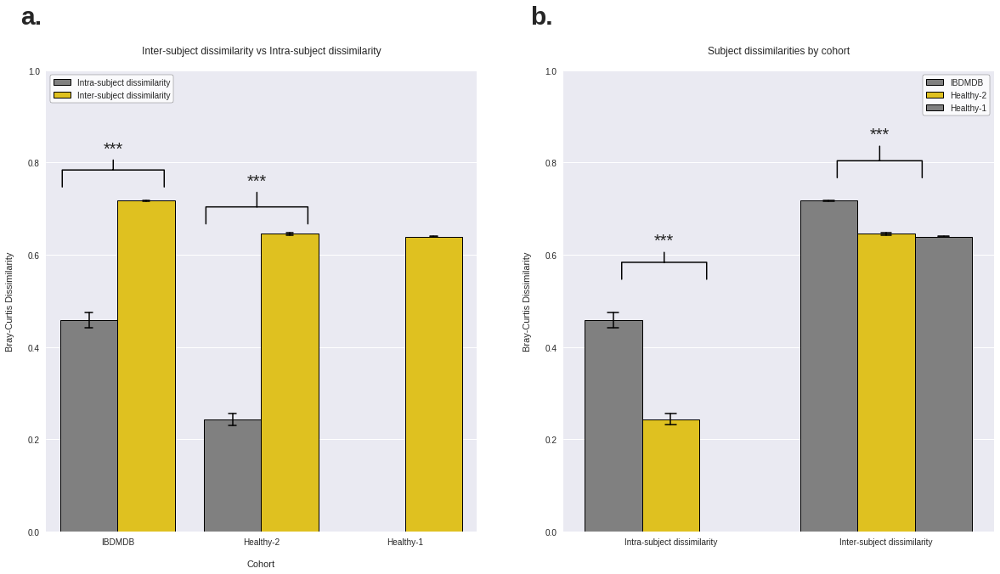

In [48]:
# Import the necessary modules
from skbio.diversity import beta_diversity

# Lists to store the dissimilarities
intra_diss = []
inter_diss = []

results = {} # dictionary containing {cohort:[list of intra-diss, list of inter-diss, cohort]}

# Slice the DF by cohort
for cohort in ["IBDMDB", "Healthy-2"]: # only 2 cohorts have replicates
    csdf = unt_df[unt_df.Cohort == cohort].drop("Cohort", axis=1).fillna(0) # Cohort Slice DF
    
    # Create the Bray-Curtis pair-wise distance matrix
    bc_dm = beta_diversity(metric="braycurtis",
                      counts=csdf.select_dtypes("float64"), ids=csdf.index).to_data_frame()
    
    # Extract the list of replicates and non-replicates for cohort slices
    csdfm = dfm.loc[csdf.index] # DF with metadata but only for cohort slice
    
    # Find the unique SubID's
    for usub in [k for k,v in dict(csdfm.SubID.value_counts()).items() if v > 1]: # Unique Subjects
        reps = list(csdfm[csdfm.SubID == usub].index)
        non_reps = [x for x in csdfm.index if x not in reps]

        # Find the intra-subject Bray-Curtis Dissimilarity
        tmp = bc_dm.loc[reps, reps]

        for i in tmp.index:
            for c in tmp.loc[i].index:
                if tmp.loc[i,c] == 0:
                    pass
                else:
        #             print(f"[{i},{c}]: {round(tmp.loc[i,c], 4)}")
                    intra_diss.append(round(tmp.loc[i,c], 4))
                    results[(i,c)] = [round(tmp.loc[i,c], 4), "Intra-subject dissimilarity", cohort]

        # Find the inter-subject dissimilarity
        tmp = bc_dm.loc[reps, non_reps]

        for i in tmp.index:
            for c in tmp.loc[i].index:
                inter_diss.append(round(tmp.loc[i,c], 4))
                results[(i,c)] = [round(tmp.loc[i,c], 4), "Inter-subject dissimilarity", cohort]
                


    print(f"Mean intra-subject dissimilarity ({cohort} cohort): {mean(intra_diss)}")
    print(f"Mean inter-subject dissimilarity ({cohort} cohort): {mean(inter_diss)}")
    
    
hmp_dm = beta_diversity("braycurtis",
                       counts=unt_df[unt_df.Cohort == "Healthy-1"].select_dtypes("float64"),
                       ids=unt_df[unt_df.Cohort == "Healthy-1"].index).to_data_frame()

for i in hmp_dm.index:
    for c in hmp_dm.columns:
        results[(i,c)] = [hmp_dm.loc[i,c], "Inter-subject dissimilarity", "Healthy-1"]
    
rdf = pd.DataFrame.from_dict(results, orient='index',
                       columns=["Dissim", "Type", "Cohort"])


plt.figure(figsize=(20,10))

plt.subplot(1,2,1)

sns.barplot(data=rdf, y="Dissim", x="Cohort", orient='v', hue="Type",
           capsize=0.05, errwidth=1.5, palette=["gray", "gold"], 
           edgecolor='k', linewidth=1, errcolor="k")

plt.title("Inter-subject dissimilarity vs Intra-subject dissimilarity\n")
plt.ylabel("Bray-Curtis Dissimilarity\n")
plt.xlabel("\nCohort")

plt.ylim(0,1)

plt.annotate(s="***", xy=(-0.03,0.78), ha='center',
            arrowprops=dict(arrowstyle='-[, widthB=3, lengthB=1', lw=1.5),
            xytext=(-0.03,0.82), fontsize=20)

plt.annotate(s="***", xy=(0.97,0.7), ha='center',
            arrowprops=dict(arrowstyle='-[, widthB=3, lengthB=1', lw=1.5),
            xytext=(0.97,0.75), fontsize=20)

plt.legend(facecolor="white", frameon=True, edgecolor='k')


plt.text(s="a.", x=-0.6, y=1.1, ha='center',
            size=30, weight='bold')
# plt.annotate(s="*** indicates p-value < 0.005", xy=(0,0.95), ha='right',
#             bbox=dict(facecolor="wheat"))


plt.subplot(1,2,2)
sns.barplot(data=rdf, y="Dissim", x="Type", orient='v', hue="Cohort",
           capsize=0.05, errwidth=1.5, palette=["gray", "gold"], 
           edgecolor='k', linewidth=1, errcolor="k")

plt.ylim(0,1)

plt.title("Subject dissimilarities by cohort\n")
plt.ylabel("Bray-Curtis Dissimilarity\n")
plt.xlabel("")

plt.annotate(s="***", xy=(-0.03,0.58), ha='center',
            arrowprops=dict(arrowstyle='-[, widthB=2.5, lengthB=1', lw=1.5),
            xytext=(-0.03,0.62), fontsize=20)

plt.annotate(s="***", xy=(0.97,0.8), ha='center',
            arrowprops=dict(arrowstyle='-[, widthB=2.5, lengthB=1', lw=1.5),
            xytext=(0.97,0.85), fontsize=20)

plt.legend(facecolor="white", frameon=True, edgecolor='k')

plt.text(s="b.", x=-0.6, y=1.1, ha='center',
            size=30, weight='bold')

# Compare the intra-subject dissimilarity between cohorts
print(stats.mannwhitneyu(rdf[(rdf.Cohort == "Healthy-2") \
                       & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.Cohort == "IBDMDB") \
                   & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values))

# plt.savefig("../Fronteirs/Images/replicate-dissim.tiff", dpi=300, bbox_inches='tight')

# Compare the inter-subject dissimilarity to the intrea-subject dissim within each cohort
stats.mannwhitneyu(inter_diss, intra_diss)

In [49]:
# Compare the intra-subject dissimilarity between cohorts
stats.mannwhitneyu(rdf[(rdf.Cohort == "Healthy-2") \
                       & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.Cohort == "IBDMDB") \
                   & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=218774810.5, pvalue=0.0)

In [50]:
# Compare the intra-subject dissimilarity between cohorts
stats.mannwhitneyu(rdf[(rdf.Cohort == "Healthy-2") \
                       & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.Cohort == "IBDMDB") \
                   & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=28484.0, pvalue=2.4170878128785516e-56)

In [51]:
# Compare the intra-subject dissimilarity between cohorts
stats.mannwhitneyu(rdf[(rdf.Cohort == "Healthy-2") \
                       & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.Cohort == "IBDMDB") \
                   & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=28484.0, pvalue=2.4170878128785516e-56)

Mean intrapersonal dissimilarity (IBD diagnosis): 0.4751546255506608
Mean Interpersonal dissimilarity (IBD diagnosis): 0.7158994418883232
Mean intrapersonal dissimilarity (nonIBD diagnosis): 0.4583564393939394
Mean Interpersonal dissimilarity (nonIBD diagnosis): 0.7157504754461378
Mean intrapersonal dissimilarity (Healthy-2 diagnosis): 0.3789689737470167
Mean Interpersonal dissimilarity (Healthy-2 diagnosis): 0.6999122725715783


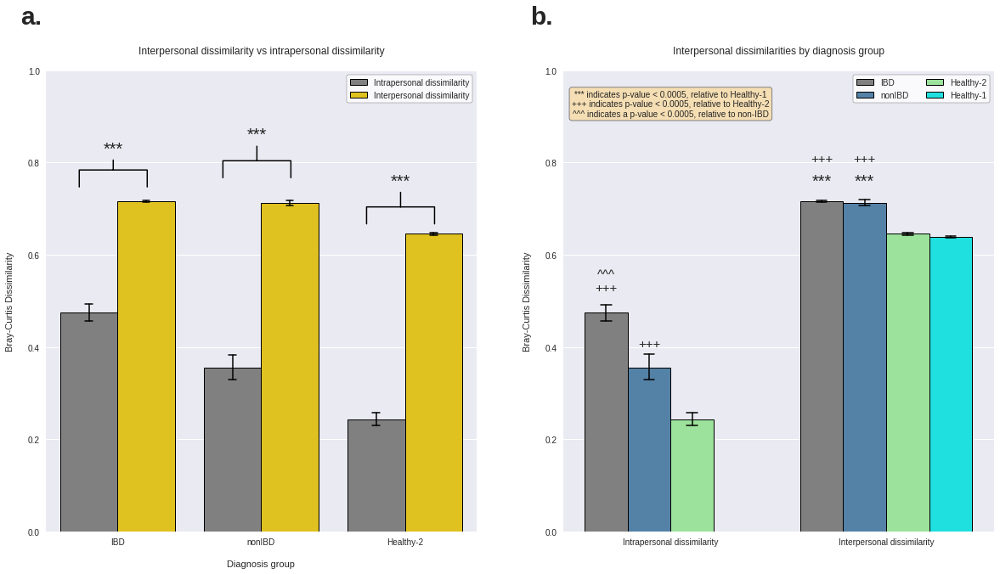

In [52]:
# Import the necessary modules
from skbio.diversity import beta_diversity

# Lists to store the dissimilarities
intra_diss = []
inter_diss = []

results = {} # dictionary containing {diagnosis:[list of intra-diss, list of inter-diss, diagnosis]}

# Slice the DF by diagnosis
for diagnosis in ["IBD", "nonIBD", "Healthy-2"]: # only 2 diagnosiss have replicates
    csdf = udf[udf.diagnosis == diagnosis].drop("diagnosis", axis=1).fillna(0) # diagnosis Slice DF
    
    # Create the Bray-Curtis pair-wise distance matrix
    bc_dm = beta_diversity(metric="braycurtis",
                      counts=csdf.select_dtypes("float64"), ids=csdf.index).to_data_frame()
    
    # Extract the list of replicates and non-replicates for diagnosis slices
    csdfm = dfm.loc[csdf.index] # DF with metadata but only for diagnosis slice
    
    # Find the unique SubID's
    for usub in [k for k,v in dict(csdfm.SubID.value_counts()).items() if v > 1]: # Unique Subjects
        reps = list(csdfm[csdfm.SubID == usub].index)
        non_reps = [x for x in csdfm.index if x not in reps]

        # Find the intrapersonal Bray-Curtis Dissimilarity
        tmp = bc_dm.loc[reps, reps]

        for i in tmp.index:
            for c in tmp.loc[i].index:
                if tmp.loc[i,c] == 0:
                    pass
                else:
        #             print(f"[{i},{c}]: {round(tmp.loc[i,c], 4)}")
                    intra_diss.append(round(tmp.loc[i,c], 4))
                    results[(i,c)] = [round(tmp.loc[i,c], 4), "Intrapersonal dissimilarity", diagnosis]

        # Find the Interpersonal dissimilarity
        tmp = bc_dm.loc[reps, non_reps]

        for i in tmp.index:
            for c in tmp.loc[i].index:
                inter_diss.append(round(tmp.loc[i,c], 4))
                results[(i,c)] = [round(tmp.loc[i,c], 4), "Interpersonal dissimilarity", diagnosis]
                


    print(f"Mean intrapersonal dissimilarity ({diagnosis} diagnosis): {mean(intra_diss)}")
    print(f"Mean Interpersonal dissimilarity ({diagnosis} diagnosis): {mean(inter_diss)}")
    
    
hmp_dm = beta_diversity("braycurtis",
                       counts=udf[udf.diagnosis == "Healthy-1"].select_dtypes("float64"),
                       ids=udf[udf.diagnosis == "Healthy-1"].index).to_data_frame()

for i in hmp_dm.index:
    for c in hmp_dm.columns:
        results[(i,c)] = [hmp_dm.loc[i,c], "Interpersonal dissimilarity", "Healthy-1"]
    
rdf = pd.DataFrame.from_dict(results, orient='index',
                       columns=["Dissim", "Type", "diagnosis"])


plt.figure(figsize=(20,10))

plt.subplot(1,2,1)

sns.barplot(data=rdf, y="Dissim", x="diagnosis", orient='v', hue="Type",
           capsize=0.05, errwidth=1.5, palette=["gray", "gold"], 
           edgecolor='k', linewidth=1, errcolor="k", order=["IBD", "nonIBD", "Healthy-2"])

plt.title("Interpersonal dissimilarity vs intrapersonal dissimilarity\n")
plt.ylabel("Bray-Curtis Dissimilarity\n")
plt.xlabel("\nDiagnosis group")

plt.ylim(0,1)

plt.annotate(s="***", xy=(-0.03,0.78), ha='center',
            arrowprops=dict(arrowstyle='-[, widthB=2, lengthB=1', lw=1.5),
            xytext=(-0.03,0.82), fontsize=20)

plt.annotate(s="***", xy=(0.97,0.8), ha='center',
            arrowprops=dict(arrowstyle='-[, widthB=2, lengthB=1', lw=1.5),
            xytext=(0.97,0.85), fontsize=20)

plt.annotate(s="***", xy=(1.97,0.7), ha='center',
            arrowprops=dict(arrowstyle='-[, widthB=2, lengthB=1', lw=1.5),
            xytext=(1.97,0.75), fontsize=20)

plt.legend(facecolor="white", frameon=True, edgecolor='k')


plt.text(s="a.", x=-0.6, y=1.1, ha='center',
            size=30, weight='bold')
# plt.annotate(s="*** indicates p-value < 0.005", xy=(0,0.95), ha='right',
#             bbox=dict(facecolor="wheat"))


plt.subplot(1,2,2)
sns.barplot(data=rdf, y="Dissim", x="Type", orient='v', hue="diagnosis",
           capsize=0.05, errwidth=1.5, palette=["gray", "steelblue", "lightgreen", "cyan"], 
           edgecolor='k', linewidth=1, errcolor="k")

plt.ylim(0,1)

plt.title("Interpersonal dissimilarities by diagnosis group\n")
plt.ylabel("Bray-Curtis Dissimilarity\n")
plt.xlabel("")

# Use '+++' to denote significantly different than Healthy-2
plt.annotate(s="+++", xy=(-0.3,0.52), ha='center', fontsize=15)
plt.annotate(s="^^^", xy=(-0.3,0.55), ha='center', fontsize=15)

plt.annotate(s="+++", xy=(-0.1 ,0.4), ha='center', fontsize=15)

# Use '***' to denonte significantly different than Healthy-1
plt.annotate(s="***", xy=(0.7, 0.75), ha='center', fontsize=20)
plt.annotate(s="+++", xy=(0.7, 0.8), ha='center', fontsize=15)

plt.annotate(s="***", xy=(0.9, 0.75), ha='center', fontsize=20)
plt.annotate(s="+++", xy=(0.9, 0.8), ha='center', fontsize=15)

plt.legend(facecolor="white", frameon=True, edgecolor='k', ncol=2)

plt.text(s="b.", x=-0.6, y=1.1, ha='center',
            size=30, weight='bold')

plt.text(s="""*** indicates p-value < 0.0005, relative to Healthy-1
+++ indicates p-value < 0.0005, relative to Healthy-2
^^^ indicates a p-value < 0.0005, relative to non-IBD""",
        x=0, y=0.9, fontsize=10, ha='center',
        bbox=dict(facecolor="wheat", linewidth=1, edgecolor='gray', boxstyle='round'))

plt.savefig("../Fronteirs/Images/replicate-dissim-composite.tiff", dpi=300, bbox_inches='tight')

### Compare inter and intra subject dissims within each diagnosis
- Are replicates more similar to each other than they are to samples from other individuals?
    - Replicates are more similar to each other than to other samples in every single diagnosis group

In [53]:
# Compare the intra-subject and inter-subject dissimilarity within IBD
stats.mannwhitneyu(rdf[(rdf.diagnosis == "IBD") \
                       & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "IBD") \
                   & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values)

/home/sayf/.local/lib/python3.8/site-packages/scipy/stats/stats.py:7039: RuntimeWarning: divide by zero encountered in double_scalars
  z = (bigu - meanrank) / sd


MannwhitneyuResult(statistic=0.0, pvalue=0.0)

In [54]:
# Compare the intra-subject and inter-subject dissimilarity within non-IBD
stats.mannwhitneyu(rdf[(rdf.diagnosis == "nonIBD") \
                       & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "nonIBD") \
                   & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

In [55]:
# Compare the intra-subject and inter-subject dissimilarity between Healthy-2
stats.mannwhitneyu(rdf[(rdf.diagnosis == "Healthy-2") \
                       & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "Healthy-2") \
                   & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

### Compare intra-subject dissim between diagnoses
- Are subjects with a certain diagnosis more likely to demonstrate temporal variabiity within their microbiome?
    - IBD more variable than non-IBD and H2
    - non-IBD more variable than H2

In [56]:
# Compare the intra-subject dissimilarity between IBD and non-IBD
stats.mannwhitneyu(rdf[(rdf.diagnosis == "nonIBD") \
                       & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "IBD") \
                   & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

In [57]:
# Compare the intra-subject dissimilarity between IBD and Healthy-2
stats.mannwhitneyu(rdf[(rdf.diagnosis == "Healthy-2") \
                       & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "IBD") \
                   & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

In [58]:
# Compare the intra-subject dissimilarity between non-IBD and Healthy-2
stats.mannwhitneyu(rdf[(rdf.diagnosis == "Healthy-2") \
                       & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "nonIBD") \
                   & (rdf.Type == "Intra-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

### Compare the inter-subject dissimilarities between cohorts
- Are samples more variable within a specific disease group?
    - IBD more variable than non-IBD, H1, and H2
    - non-IBD more variable than H1 and H2

In [59]:
# Compare the inter-subject dissimilarity between IBD and Healthy-1
stats.mannwhitneyu(rdf[(rdf.diagnosis == "IBD") \
                       & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "nonIBD") \
                   & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

In [60]:
# Compare the inter-subject dissimilarity between IBD and Healthy-1
stats.mannwhitneyu(rdf[(rdf.diagnosis == "IBD") \
                       & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "Healthy-1") \
                   & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

In [61]:
# Compare the intra-subject dissimilarity between cohorts
stats.mannwhitneyu(rdf[(rdf.diagnosis == "Healthy-2") \
                       & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "Healthy-1") \
                   & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

In [62]:
# Compare the inter-subject dissimilarity between IBD and Healthy-2
stats.mannwhitneyu(rdf[(rdf.diagnosis == "Healthy-2") \
                       & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "IBD") \
                   & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

In [63]:
# Compare the inter-subject dissimilarity between non-IBD and Healthy-1
stats.mannwhitneyu(rdf[(rdf.diagnosis == "Healthy-1") \
                       & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "nonIBD") \
                   & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

In [64]:
# Compare the inter-subject dissimilarity between IBD and Healthy-2
stats.mannwhitneyu(rdf[(rdf.diagnosis == "Healthy-2") \
                       & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values,
                  rdf[(rdf.diagnosis == "nonIBD") \
                   & (rdf.Type == "Inter-subject dissimilarity")].Dissim.values)

MannwhitneyuResult(statistic=0.0, pvalue=0.0)

# Network analysis

In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

import statistics
import math

from tqdm.notebook import tqdm as tqdm_nb
from collections import Counter

import os
import re

## Create the files for the Network Analysis

In [66]:
print(f"kns: {pd.read_csv('./DataFiles/kns_imp_specs.csv').shape}")
print(f"hmp: {pd.read_csv('./DataFiles/hmp_imp_specs.csv').shape}")
print(f"ibd: {pd.read_csv('./DataFiles/ibd_imp_specs.csv').shape}")
print(f"nibd: {pd.read_csv('./DataFiles/nibd_imp_specs.csv').shape}")

labels = pd.read_csv("./DataFiles/DiffAbundanceList.csv", index_col="Unnamed: 0")

kns: (114, 120)
hmp: (203, 120)
ibd: (208, 120)
nibd: (49, 120)


### Create mean taxonomic profiles using replicates

## Import the networks

In [67]:
def MakeNet(F, thresh=0.01):
    """
    Function to create the network object from the partical correlations matrix
    
    Parameters
    ----------
    F: Path to csv containing the partial correlation matrix
    
    Returns
    -------
    nx.Graph object
    
    """

    # Import matrix
    try:
        df = pd.read_csv(F, index_col="Unnamed: 0")
    except:
        try:
            df = pd.read_csv(F, index_col="Names")
        except:
            df = pd.read_csv(F)

    # Create an empty graph
    G = nx.Graph()
    
    df.index = df.columns

    # Iterate through the data to extract the nodes, edges, and weights
    for n1 in df.columns:
        for n2 in df.index:
            if abs(df.loc[n2,n1]) >= thresh and n2 != n1:
                if abs(df.loc[n2,n1]) != 0:
                    # Add weighted edge (wt) between node1 (n1) and node2 (n2)
                    G.add_edge(n1,n2, weight = df.loc[n2,n1])
                else:
                    G.add_edge(n1,n2, weight=0)
                
    non_zero_edges = [(e1,e2) for e1, e2, data in G.edges(data=True) if data["weight"] != 0]
                    
    print(f"{F.split('/')[-1].split('-')[0]}: N: {len(G.nodes)} E:{len(non_zero_edges)}")
    return G

In [68]:
ibdG = MakeNet('./DataFiles/ibd_imp_specs_resultsPCorOmega.csv')
nibdG = MakeNet('./DataFiles/nibd_imp_specs_resultsPCorOmega.csv')
hmpG = MakeNet('./DataFiles/hmp_imp_specs_resultsPCorOmega.csv')
knsG = MakeNet('./DataFiles/kns_imp_specs_resultsPCorOmega.csv')

ibd_imp_specs_resultsPCorOmega.csv: N: 59 E:124
nibd_imp_specs_resultsPCorOmega.csv: N: 57 E:148
hmp_imp_specs_resultsPCorOmega.csv: N: 64 E:143
kns_imp_specs_resultsPCorOmega.csv: N: 80 E:197


## Examine shared edges

In [69]:
def FindSharedEdges():
    """
    Function to spit out stats on the edges in the various groups
    """
        
    # We can be quicker with list comp, but we may lose some info (counts, and exact network names)
    global ibd_edges, nibd_edges, hmp_edges, kns_edges
    
    # Have to make the edges into strings to work with Counter properly
    ibd_edges = [f"{sorted(e)[0]} :: {sorted(e)[1]}" for e in ibdG.edges]
    nibd_edges = [f"{sorted(e)[0]} :: {sorted(e)[1]}" for e in nibdG.edges]
    hmp_edges = [f"{sorted(e)[0]} :: {sorted(e)[1]}" for e in hmpG.edges]
    kns_edges = [f"{sorted(e)[0]} :: {sorted(e)[1]}" for e in knsG.edges]
    
    
    # Edges that are not in IBD but are present in nonIBD and at least one healthy network
    global healthy_or_edges
    healthy_or_edges = [e for e in nibd_edges if e not in ibd_edges and e in hmp_edges or e in kns_edges]
    
    # Edges that are not in IBD but are present in nonIBD and are present in both healthy networks
    global healthy_and_edges
    healthy_and_edges = [e for e in nibd_edges if e not in ibd_edges and e in hmp_edges and e in kns_edges]
    
    # Edges that are shared in all networks
    global shared_edges
    shared_edges = [e for e in nibd_edges if e in ibd_edges and e in hmp_edges and e in kns_edges]
    
    # Edges that are only found in IBD
    global ibd_only_edges
    ibd_only_edges = [e for e in ibd_edges if e not in nibd_edges and e not in hmp_edges and e not in kns_edges]
    
    
    global all_edges
    all_edges = ibd_edges.copy()
    all_edges.extend(kns_edges)
    all_edges.extend(hmp_edges)
    all_edges.extend(nibd_edges)
    
    global edge_dict
    edge_dict = dict(Counter(all_edges).most_common())
    
    print(f"Union of associations from all groups: {len(edge_dict)}")
    print(f"Associations found only in IBD: {len(ibd_only_edges)}")
    print(f"Associations found in nonIBD and at least one other healthy cohort: {len(healthy_or_edges)}")
    print(f"Associations found only in healthy and found in all healthy cohorts: {len(healthy_and_edges)}")
    print(f"Associations found in all groups: {len(shared_edges)}")
        
FindSharedEdges()

Union of associations from all groups: 474
Associations found only in IBD: 56
Associations found in nonIBD and at least one other healthy cohort: 41
Associations found only in healthy and found in all healthy cohorts: 6
Associations found in all groups: 3


In [70]:
ibd_elevated_nodes = list(labels[labels.Status == "Elevated in IBD"].index)
ecnt = sum([1 for e in ibd_only_edges \
     if e.split(" :: ")[0] in ibd_elevated_nodes or e.split(" :: ")[1] in ibd_elevated_nodes])

print(f"{round((ecnt/len(ibd_only_edges))*100, 2)}% of edges only in IBD involve species elevated in IBD")

85.71% of edges only in IBD involve species elevated in IBD


### Plot the edges unique to IBD

In [71]:
def LabelUniqEdges(G, label_file, group, label_degs=False, font_size=9, label_nodes=True, 
                   uniq_edges=False, fig_size=(24,24)):
    """
    Function to draw the provided graph
    
    Parameters
    ----------
    G: nx.Graph object
    
    Returns
    -------
    Network image
    
    """
    
    # Re-work the node names so they fit nicely into the nodes
    mappings = {}
    
    for i in G.nodes():
        mappings[i] = i.replace("_", "\n")
    
    G = nx.relabel_nodes(G, mappings)
    
    # Import the label_file
    dal = pd.read_csv(label_file, index_col="Unnamed: 0")
    labels = dal[[x for x in dal.columns if "mean" in x]].apply(lambda x:x + abs(x.min())).join(dal[["Color", "Status"]])
    
    
    # Draw the graph using matplotlib
    plt.figure(figsize=fig_size)
    ax = plt.gca()
    ax.set_facecolor("white")
    
    if label_degs:
        plt.title(f"{group} network\nNode sizes based on degree")
        if label_nodes:
            node_sizes = [d*300 for d in dict(G.degree).values()]
        else:
            node_sizes = [d*75 for d in dict(G.degree).values()]
    else:
        # Don't use degree for node-sizes anymore; use abundance   
        plt.title(f"{group} network\nNode sizes based on abundance")
        node_sizes = []
        group_name = f"{group}_mean"
        for n in G.nodes:
            if label_nodes:
                node_sizes.append(labels.loc[n.replace("\n", "_"), group_name] **3)
            else:
                node_sizes.append(labels.loc[n.replace("\n", "_"), group_name] **3)
    
    hi_dct = {}
    for i in labels.index:
        hi_dct[labels.loc[i, "Status"]] = labels.loc[i, "Color"]

    # Create a list of colors for targets
    color_list = []

    for n in G.nodes:
        color_list.append(labels.loc[n.replace("\n", "_"), "Color"])

    pos = nx.circular_layout(G) # Create the positions for the nodes
    npos = {}

    bacs = [x for x in sorted(labels.index) if x.replace("_", "\n") in pos.keys()]
    for n,p in zip(bacs, pos.values()):
        npos[n.replace("_", "\n")] = p
        
    pos = npos
#     pos = nx.nx_agraph.graphviz_layout(G) # Create the positions for the nodes
    
    if label_nodes:
        # Label nodes with bacteria names
        nodes = nx.draw_networkx_nodes(G, pos, node_size=node_sizes, 
                                                          node_shape="H",node_color=color_list)
        nx.draw_networkx_labels(G, pos, font_size=font_size)
    else:
        nodes = nx.draw_networkx_nodes(G, pos, node_size=node_sizes, 
                                       node_shape="o", node_color=color_list)

    nodes.set_edgecolor("k")
    
    # Insert a legend for the node colors
    from matplotlib.lines import Line2D

    legend_elements = []
    for l in hi_dct.keys():
        legend_elements.append(Line2D([0], [0], label=l, color="none",\
                      marker="H", markerfacecolor=hi_dct[l], markersize=10))

    legend1 = plt.legend(handles=legend_elements, loc='upper center', ncol=3)
    plt.gca().add_artist(legend1)

    
    if uniq_edges:
        # Create a list of the unique edges
        global ibd_targ_edges
        ibd_targ_edges = [(x.split(" :: ")[0],x.split(" :: ")[1]) for x in ibd_only_edges]
        
        # Create a list of the negative edges
        ne = [(n1, n2) for n1,n2, d in G.edges(data=True) if d["weight"] < 0 \
             and (n1.replace("\n", "_"),n2.replace("\n", "_")) not in ibd_targ_edges]

        # Create a list of the positive edges
        pe = [(n1, n2) for n1,n2, d in G.edges(data=True) if d["weight"] > 0 \
             and (n1.replace("\n", "_"),n2.replace("\n", "_")) not in ibd_targ_edges]
        
        # Create a list of the positive and unique edges
        global pue, nue
        pue = [(n1, n2) for n1,n2, d in G.edges(data=True) if d["weight"] > 0 \
               and (n1.replace("\n", "_"),n2.replace("\n", "_")) in ibd_targ_edges]
        
        # Create a list of the negative and unique edges
        nue = [(n1, n2) for n1,n2, d in G.edges(data=True) if d["weight"] < 0 \
               and (n1.replace("\n", "_"),n2.replace("\n", "_")) in ibd_targ_edges]
        
        # Add in the legends describing the line colors
        edge_legend_labels = {"Negative Association":["red", "_"], 
                              "Positive Association":["green", "_"],
                             "Positive Unique (IBD) Association":["cyan", "_"],
                             "Negative Unique (IBD) Association":["violet", "_"]}
        legend_elements = []
        for l in edge_legend_labels.keys():
            legend_elements.append(Line2D([0], [0], label=l, 
                          color=edge_legend_labels[l][0],\
                          marker=edge_legend_labels[l][1], 
                                          markersize=10))

        legend2 = plt.legend(handles=legend_elements, loc='upper right', ncol=1,
                            frameon=True, edgecolor='k', facecolor='white')
        plt.gca().add_artist(legend2)
        
        
        # Draw the edges
        nx.draw_networkx_edges(G, pos, edgelist=ne,\
                               style='dashed', edge_color='red', width=2)
        nx.draw_networkx_edges(G, pos, edgelist=pe,\
                               style='dashed', edge_color='green', width=2)
        nx.draw_networkx_edges(G, pos, edgelist=pue,\
                           style='solid', edge_color='cyan', width=2)
        nx.draw_networkx_edges(G, pos, edgelist=nue,\
                           style='solid', edge_color='violet', width=2)
        
    else:
        # Create a list of the negative edges
        ne = [(n1, n2) for n1,n2, d in G.edges(data=True) if d["weight"] < 0]

        # Create a list of the positive edges
        pe = [(n1, n2) for n1,n2, d in G.edges(data=True) if d["weight"] > 0]

        # Draw the edges
        nx.draw_networkx_edges(G, pos, edgelist=ne,\
                               style='dashed', edge_color='red', width=2)

        nx.draw_networkx_edges(G, pos, edgelist=pe,\
                               style='dashed', edge_color='green', width=2)

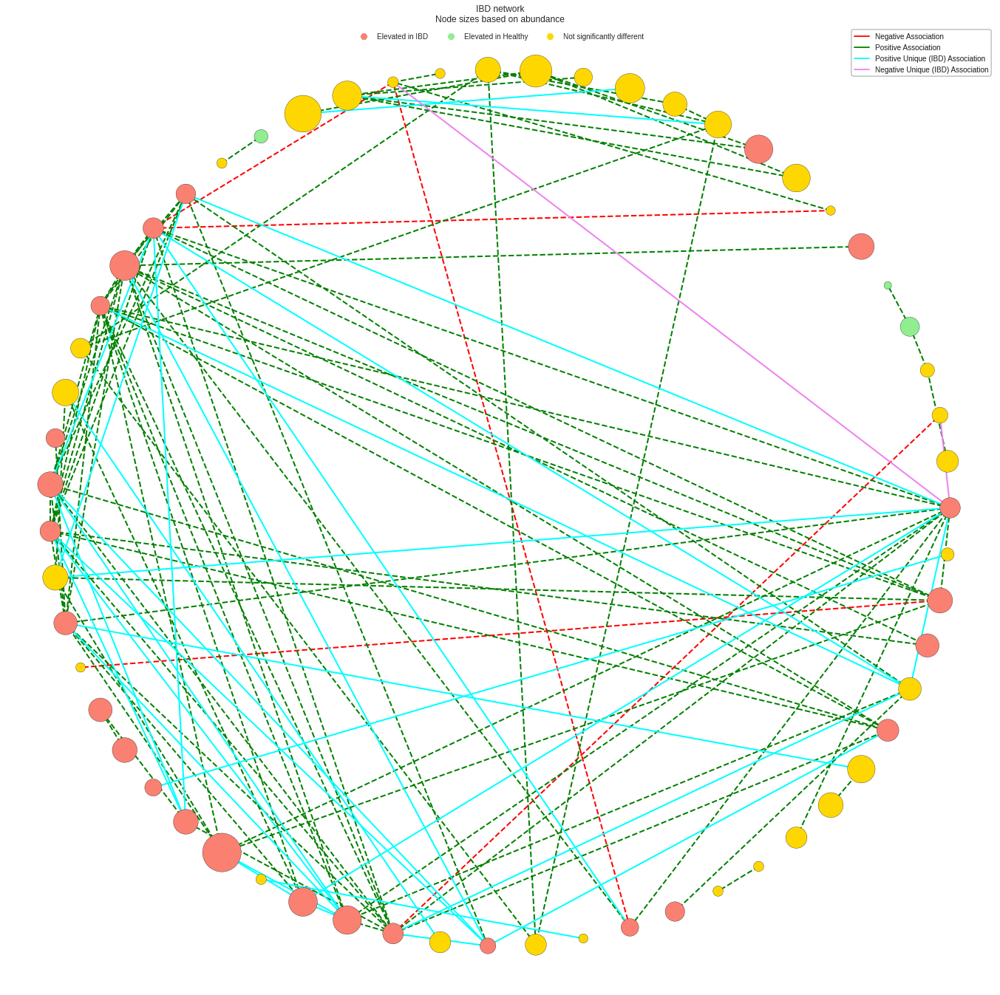

In [72]:
LabelUniqEdges(ibdG,"./DataFiles/DiffAbundanceList.csv", group="IBD", uniq_edges=True, label_nodes=False)

# plt.savefig("../Fronteirs/Images/ibd-net-unique-edges.tiff", 
#             dpi=300, bbox_inches='tight')

## Examine the edges by diff abundance status

In [73]:
def ExamineNodeStatuses(G, group, target_label):
    """
    Function to examine node composition by diff abundance status
    
    Parameters
    ----------
    G: nx.Graph object
    group: Name of group being analyzed
    target_label: Diff abundance status label
    
    Returns
    -------
    Print out with results
    """

    edges = []
    [edges.extend([e1,e2]) for e1,e2 in G.edges]
    edges = set(edges)

    res = dict(labels.loc[edges].Status.value_counts())

    perc = round((res[target_label]/ sum(res.values()))*100, 2)

    print(f"{group}: {perc}% of nodes are composed of species that are {target_label.lower()}")
    

In [74]:
ExamineNodeStatuses(ibdG, group="IBD", target_label="Not significantly different")
ExamineNodeStatuses(nibdG, group="non-IBD", target_label="Not significantly different")
ExamineNodeStatuses(hmpG, group="Healthy-1", target_label="Not significantly different")
ExamineNodeStatuses(knsG, group="Healthy-2", target_label="Not significantly different")

IBD: 52.54% of nodes are composed of species that are not significantly different
non-IBD: 52.63% of nodes are composed of species that are not significantly different
Healthy-1: 65.62% of nodes are composed of species that are not significantly different
Healthy-2: 53.75% of nodes are composed of species that are not significantly different


## Examine the Eigenvector Centrality (EVC)
- Eigenvector centrality (EVC) measures the influence a node has in a network by accounting for the connections of the node in question as well as the connections of its neighbors

In [75]:
def FindEigenCents(G, n=10, return_data=False):
    """
    Function to find the top-n nodes based on Eigenvector centrality (EVC)
    
    Parameters
    ----------
    G: nx.Graph object
    n: Integer specifying how many nodes to return
    
    Returns
    -------
    List containing top-n EVC nodes
    """
    
    from operator import itemgetter
    
    global evc_dict
    evc_dict = nx.eigenvector_centrality(G)
    top_evc = [x[0] for x in sorted(evc_dict.items(), key=itemgetter(1), reverse=True)[:n]]
    
    if return_data:
        evc_df = pd.DataFrame.from_dict(evc_dict, orient='index',
                                       columns=["EVC"])
        return evc_df.loc[top_evc]
    else: 
        return top_evc

In [76]:
# Calculate the EVC's
ibd_evc = FindEigenCents(ibdG)
nibd_evc = FindEigenCents(nibdG)
kns_evc = FindEigenCents(knsG)
hmp_evc = FindEigenCents(hmpG)

In [77]:
ibd_evc_df = FindEigenCents(ibdG, return_data=True)
ibd_evc_df["DiagnosisGroup"] = "IBD"

nibd_evc_df = FindEigenCents(nibdG, return_data=True)
nibd_evc_df["DiagnosisGroup"] = "non-IBD"

hmp_evc_df = FindEigenCents(hmpG, return_data=True)
hmp_evc_df["DiagnosisGroup"] = "Healthy-1"

kns_evc_df = FindEigenCents(knsG, return_data=True)
kns_evc_df["DiagnosisGroup"] = "Healthy-2"



tot_evcs = pd.concat([ibd_evc_df, nibd_evc_df, hmp_evc_df, kns_evc_df])\
.reset_index().rename(columns={'index':"Species"})

# tot_evcs.to_csv("../Fronteirs/Images/EVC-table.csv")

In [78]:
# All top-10 EVC's in IBD have relative abundances that are elevated in IBD
dict(labels.loc[ibd_evc].Status.value_counts())

{'Elevated in IBD': 10}

In [79]:
# Compare IBD top-10 EVC's to all the healthy groups
print("\nTop-10 EVC nodes only in IBD top-10 EVC")
print([x for x in ibd_evc if x not in nibd_evc \
and x not in kns_evc and x not in hmp_evc])

print("\nTop-10 EVC nodes only in Healthy top-10 EVC's")
print([x for x in nibd_evc if x not in ibd_evc \
and x in kns_evc and x in hmp_evc])


Top-10 EVC nodes only in IBD top-10 EVC
['Fusicatenibacter_saccharivorans', 'Blautia_hansenii']

Top-10 EVC nodes only in Healthy top-10 EVC's
[]


## Examine the average degree by differential abundance status

In [80]:
def ViewTops(G, top_list, print_neighbors=False):
    """
    Function to find the average edge weights of the top_list of nodes compared to other nodes

    Parameters
    ----------
    G: nx.Graph object
    top_list: list of nodes
    print_neighbors: Boolean to print out each node name and it's number of direct neighbors

    Returns
    -------
    DF object containing the results

    """
    
    weights = []
    non_weights = []
        
    for n in G.nodes:
        if print_neighbors:
            # Make the print out nicer
#             n = n.replace("\n", "_")
            string = f"{n} neighbors"
            print("-" * len(string))
            print(string)
            print("-" * len(string))

        # Correct the node names    
#         n = n.replace("_", "\n")

        # Extract the neighbors
        try:
#             print("Node: " + n.replace("\n", "_") + " neighbors: " + str(len(G[n])))
            for k,v in G[n].items():
                if n in top_list:
                    if print_neighbors:
#                         k = k.replace("\n", "_")
                        print(f"{k}: {v}")
                    else:
                        weights.append(v["weight"])
                
                else:
                    non_weights.append(v["weight"])
        except KeyError:
            pass
        
    deg_df = pd.DataFrame.from_dict(dict(G.degree), orient='index', columns=["degree"])
    found = {} # {node:degree}
         
    # Correct the node names
    for n in top_list:
        # Extract the degrees
        try:
            found[n] = int(deg_df.loc[n])
            
        except KeyError:
            pass
    
    # avg degree of non-top list nodes
    non_avg = deg_df.loc[[x for x in deg_df.index if x not in found]].degree.mean()
    non_sd = deg_df.loc[[x for x in deg_df.index if x not in found]].degree.std()
        
    results_cols = ["Group", "Average edge weight", "Average degree", "Degree SD"]
    results = [["Elevated in IBD", round(np.mean(weights), 4), round(np.mean(list(found.values())), 3)],
              ["Non-elevated in IBD", round(np.mean(non_weights), 4), round(non_avg, 3)]]
    
    res_dict = {"Elevated in IBD":[round(np.mean(weights), 4), 
                                   round(np.mean(list(found.values())), 3),
                                  round(np.std(list(found.values())), 3)],
              "Non-elevated in IBD": [round(np.mean(non_weights), 4), 
                                      round(non_avg, 3),
                                     round(non_sd, 3)]}
    
    rdf = pd.DataFrame.from_dict(res_dict, columns=results_cols[1:], orient='index')
    
    # Print the results
    from tabulate import tabulate
    print(tabulate(results, headers=results_cols))
    
    return rdf

In [81]:
ibd_labels = list(labels[labels.Status == "Elevated in IBD"].index)
Gdict = {"IBD":ibdG,
        "non-IBD": nibdG,
        "Healthy-1": hmpG,
        "Healthy-2": knsG}

rdf = pd.DataFrame()
for k,v in Gdict.items():
    print(f"\n\n{k} Graph")
    rdf0 = ViewTops(v, top_list=ibd_labels)
    rdf0["Graph"] = k
    rdf = pd.concat([rdf, rdf0])
    
rdf



IBD Graph
Group                  Average edge weight    Average degree
-------------------  ---------------------  ----------------
Elevated in IBD                     0.0406             6.88
Non-elevated in IBD                 0.0374             2.235


non-IBD Graph
Group                  Average edge weight    Average degree
-------------------  ---------------------  ----------------
Elevated in IBD                     0.0307             8.44
Non-elevated in IBD                 0.0313             2.656


Healthy-1 Graph
Group                  Average edge weight    Average degree
-------------------  ---------------------  ----------------
Elevated in IBD                     0.0549             4.5
Non-elevated in IBD                 0.05               4.457


Healthy-2 Graph
Group                  Average edge weight    Average degree
-------------------  ---------------------  ----------------
Elevated in IBD                     0.0404             6.667
Non-elevated in IBD      

,Average edge weight,Average degree,Degree SD,Graph
Elevated in IBD,0.0406,6.880,4.736,IBD
Non-elevated in IBD,0.0374,2.235,1.615,IBD
Elevated in IBD,0.0307,8.440,4.742,non-IBD
Non-elevated in IBD,0.0313,2.656,1.599,non-IBD
Elevated in IBD,0.0549,4.500,3.500,Healthy-1
Non-elevated in IBD,0.0500,4.457,3.880,Healthy-1
Elevated in IBD,0.0404,6.667,4.332,Healthy-2
Non-elevated in IBD,0.0365,3.702,3.175,Healthy-2


In [1]:
def CompareIBDDegs(G):
    """
    Function to compare the degrees of nodes elevated in IBD
    
    Parameters
    ----------
    G: nx.Graph object
    
    Returns
    -------
    DF object with degrees and status
    print out with MWU analysis
    """
    
    deg_df = pd.DataFrame.from_dict(dict(G.degree), orient='index', columns=["degree"])

    rdf = pd.DataFrame.from_dict(dict(deg_df.apply(lambda x:[x.degree, "Elevated in IBD"] \
                 if x.name in labels[labels.Status == "Elevated in IBD"].index \
                 else [x.degree, "non-elevated in IBD"],
                 axis=1)),
                               orient='index',
                               columns=["Degree", "Status"])

    s1 = rdf.Status.unique()[0] # Unique status 1
    s2 = rdf.Status.unique()[1] # Unique status 2

    p = stats.mannwhitneyu(x=rdf[rdf.Status == s1].Degree,
                          y=rdf[rdf.Status == s2].Degree)[1]

    print(f"MWU between {s1} and {s2} resulted in a p-value of {round(p,5)}")
    return rdf

In [84]:
crdf = pd.DataFrame()
for k,v in Gdict.items():
    print(f"\n\n{k} Graph")
    crdf0 = CompareIBDDegs(v)
    crdf0["Graph"] = k
    crdf = pd.concat([crdf, crdf0])
    
crdf



IBD Graph
MWU between Elevated in IBD and non-elevated in IBD resulted in a p-value of 8e-05


non-IBD Graph
MWU between Elevated in IBD and non-elevated in IBD resulted in a p-value of 0.0


Healthy-1 Graph
MWU between Elevated in IBD and non-elevated in IBD resulted in a p-value of 0.48491


Healthy-2 Graph
MWU between Elevated in IBD and non-elevated in IBD resulted in a p-value of 0.00014


,Degree,Status,Graph
Blautia_hydrogenotrophica,12,Elevated in IBD,IBD
Clostridium_bolteae,11,Elevated in IBD,IBD
Clostridium_citroniae,12,Elevated in IBD,IBD
Hungatella_hathewayi,13,Elevated in IBD,IBD
Merdimonas_faecis,4,Elevated in IBD,IBD
...,...,...,...
Ruminococcus_callidus,1,non-elevated in IBD,Healthy-2
Eubacterium_rectale,1,non-elevated in IBD,Healthy-2
Negativibacillus_massiliensis,2,Elevated in IBD,Healthy-2
Dorea_formicigenerans,2,Elevated in IBD,Healthy-2


Text(0.5, 0, '\nBacterial association network')

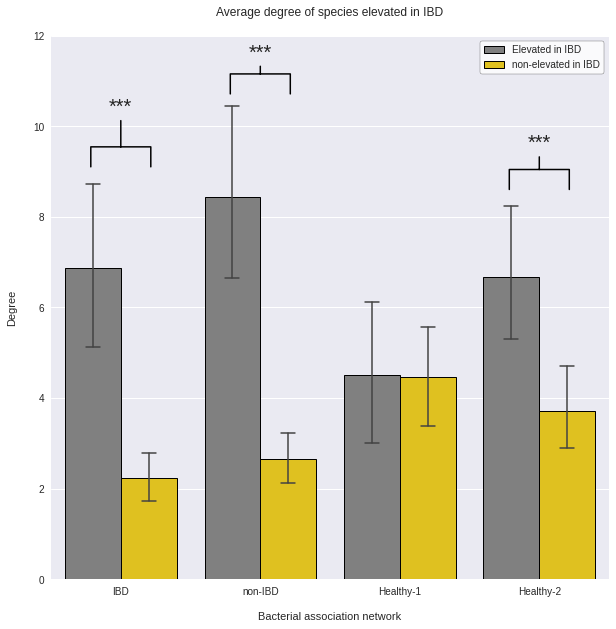

In [85]:
plt.figure(figsize=(10,10))

sns.barplot(x=crdf.Graph, y=crdf.Degree, hue=crdf.Status,
           edgecolor='k', linewidth=1, capsize=0.1, errwidth=1.5,
           palette=["gray", "gold"])

plt.ylim(0,12)

plt.legend(frameon=True, edgecolor='k', facecolor='white')

plt.annotate(s="***", xy=(0,9.5), ha='center',
            arrowprops=dict(arrowstyle='-[, widthB=1.5, lengthB=1', lw=1.5),
            xytext=(0,10.3), fontsize=20)

plt.annotate(s="***", xy=(1,11.11), ha='center',
            arrowprops=dict(arrowstyle='-[, widthB=1.5, lengthB=1', lw=1.5),
            xytext=(1,11.5), fontsize=20)

plt.annotate(s="***", xy=(3,9), ha='center',
            arrowprops=dict(arrowstyle='-[, widthB=1.5, lengthB=1', lw=1.5),
            xytext=(3,9.5), fontsize=20)

plt.title("Average degree of species elevated in IBD\n")
plt.ylabel("Degree\n")
plt.xlabel("\nBacterial association network")

# plt.savefig("../Fronteirs/Images/avg-degree-diff-abundance.tiff", bbox_inches='tight', dpi=300)

## Examine the percent of associations by Genus

In [86]:
# Set up a color key for the genera to maintain the same coloring for each circle-plot
cdict = {"Others": "silver"}
color_cnt = 1 # To keep track of numbers for the color dict

def MakeDegPie(G, thresh=2):
    """
    Function to create pie chart of genera degrees
    
    Parameters
    ----------
    clust: DF slice containing only the cluster of interest
    thresh: Minimum percent abundance before lumping into 'Others' group (default: 2)
    title: String to specify title of plot
    
    Returns
    -------
    Pie plot of relative abundance of the genera within the cluster
    
    """
    from collections import Counter
    from operator import itemgetter
    from matplotlib import cm  
    
    # Create the color dictionary
    global cdict # use a global dict to ensure continuity for all pie plots
    global color_cnt

    gen_degs = {}
    
    for n,d in nx.degree(G):
        gen = n.split("_")[0]

        if gen in gen_degs.keys():
            gen_degs[gen] += d
        else:
            gen_degs[gen] = d
    
    # Sort the values by degree
    sorted_degs = {}
    for k in sorted(gen_degs, key=gen_degs.get, reverse=True):
        sorted_degs[k] = gen_degs[k]
    
    gen_degs = sorted_degs
    
    tot_counts = sum(gen_degs.values())
    new_genera = {"Others": 0}
    
    for g,c in gen_degs.items():
        pct = round((c/tot_counts) *100, 3)

        if pct >= thresh:
            new_genera[g] = pct
            if g in cdict.keys():
                pass
            else:
                cdict[g] = cm.jet(color_cnt * 25)
                color_cnt += 1
        else:
            new_genera["Others"] += pct
            
    
    global colors
    colors = [cdict[x] for x in new_genera.keys()]

    fig = plt.figure(figsize=(10,10), dpi=300)
    ax = fig.add_axes([0,0,1,1])

    explode = [0.05]
    for i in range(len(new_genera.keys()) - 1):
        explode.append(0)

    patches, texts, pct_labels = ax.pie(new_genera.values(), labels=new_genera.keys(), 
                            autopct="%.1f%%", pctdistance=0.8,
                            colors = colors, labeldistance=1.1, explode=explode,
                           wedgeprops=dict(linewidth=2, edgecolor='k', alpha=0.5),
                           textprops=dict(fontsize=15, color="k"))

    for l in pct_labels:
        l.set_backgroundcolor("white")
        l.set(bbox=dict(facecolor='w', edgecolor='k', boxstyle="round, pad=0.2"))
        l.set(fontsize=13)

Text(0.5, 1.0, 'Percent of connections by Genus in IBD network\n')

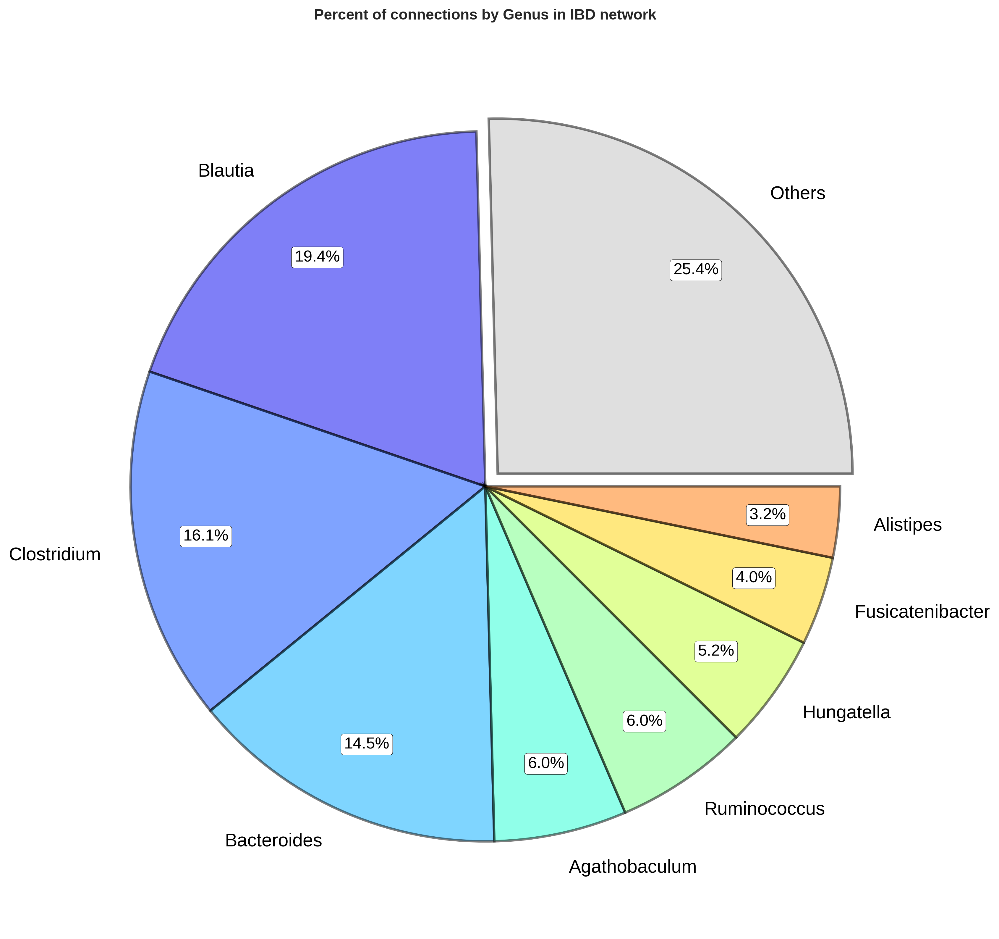

In [87]:
MakeDegPie(ibdG, thresh=3)
plt.title("Percent of connections by Genus in IBD network\n", weight='bold')

# plt.savefig("../Fronteirs/Images/gen-pie-ibd.png", dpi=300)

Text(0.5, 1.0, 'Percent of connections by Genus in non-IBD network\n')

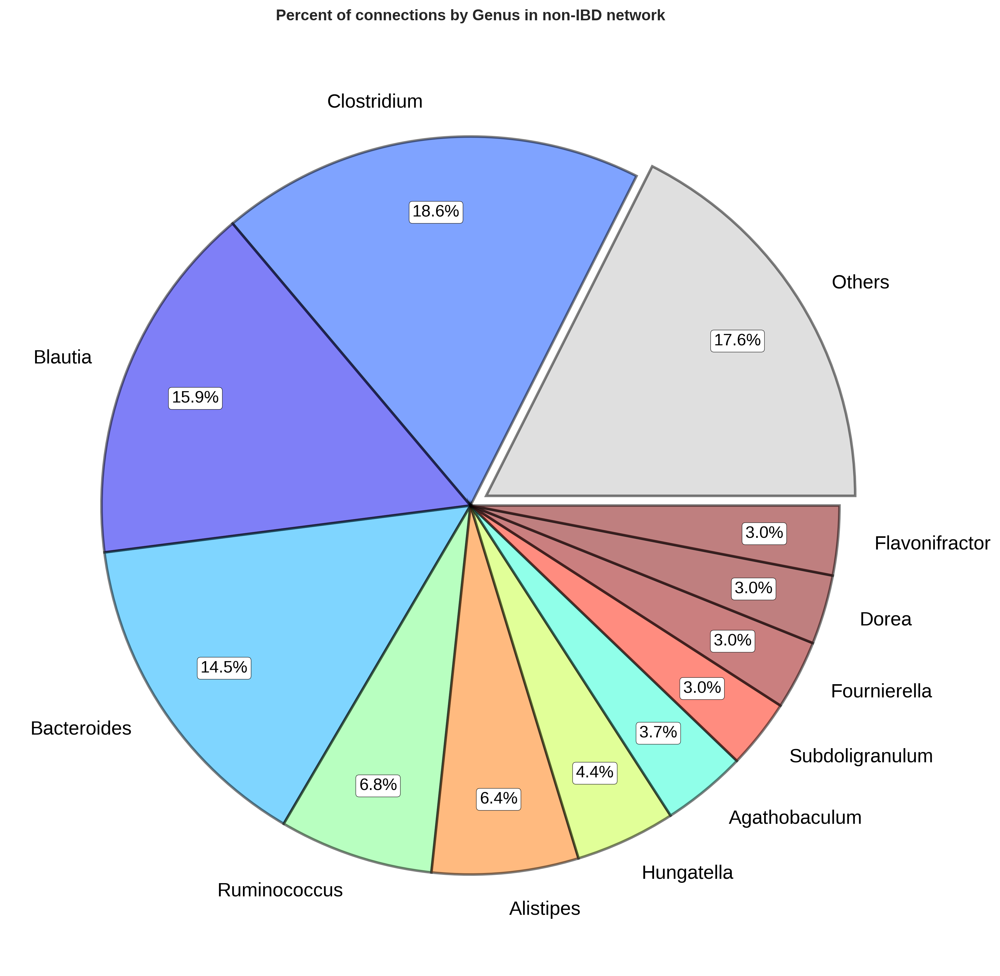

In [88]:
MakeDegPie(nibdG, thresh=3)
plt.title("Percent of connections by Genus in non-IBD network\n", weight='bold')

# plt.savefig("../Fronteirs/Images/gen-pie-nibd.png", dpi=300)

Text(0.5, 1.0, 'Percent of connections by Genus in Healthy-1 network\n')

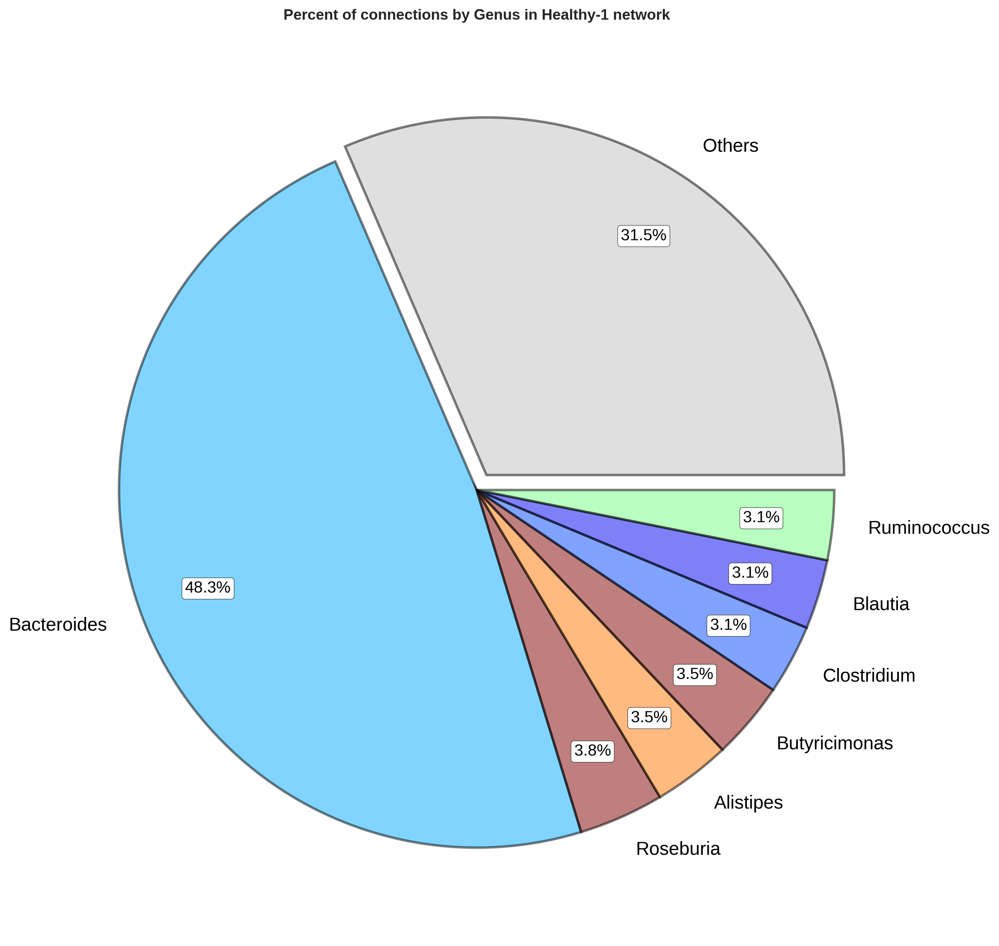

In [89]:
MakeDegPie(hmpG, thresh=3)
plt.title("Percent of connections by Genus in Healthy-1 network\n", weight='bold')

# plt.savefig("../Fronteirs/Images/gen-pie-hmp.png", dpi=300)

Text(0.5, 1.0, 'Percent of connections by Genus in Healthy-2 network\n')

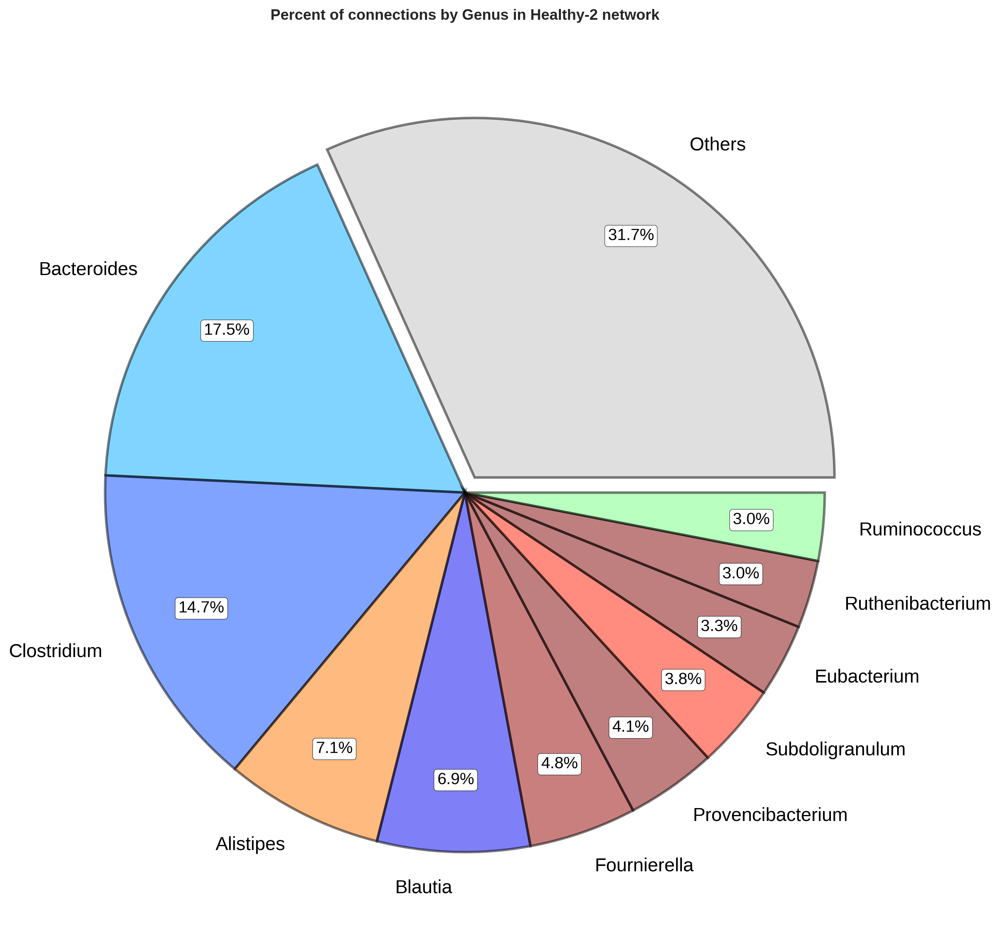

In [90]:
MakeDegPie(knsG, thresh=3)
plt.title("Percent of connections by Genus in Healthy-2 network\n", weight='bold')

# plt.savefig("../Fronteirs/Images/gen-pie-kns.png", dpi=300)

## Compare node degree by realtive abundance status

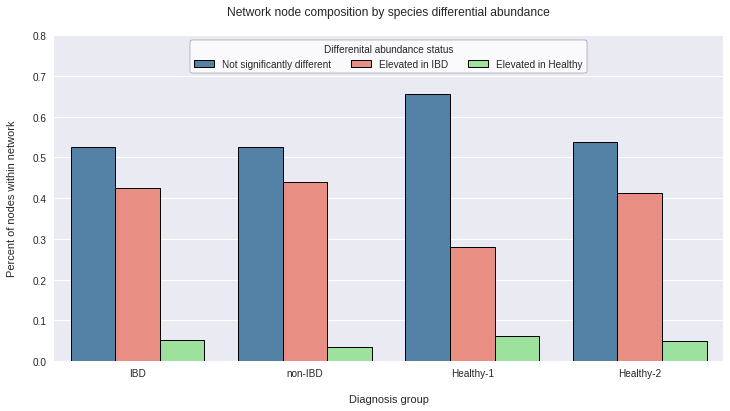

In [91]:
def ExamineStatuses(G):
    """
    Quick function to look at relative abundance status counts (e.g. elevated in IBD, etc...)
    
    Parameters
    ----------
    G: nx.Graph object
    
    Returns
    -------
    DF object containing the results
    
    """
    
    stat_list = []
    for n in G.nodes:
        stat_list.append(labels.loc[n, "Status"])


    stat_df = pd.DataFrame.from_dict(dict(Counter(stat_list).most_common()), 
                                    orient='index', columns=["Count"])

    stat_df["Percent"] = stat_df.Count/stat_df.Count.sum()

    return stat_df

ibd_edge_stats = ExamineStatuses(ibdG)
ibd_edge_stats["DiagnosisGroup"] = "IBD"

nibd_edge_stats = ExamineStatuses(nibdG)
nibd_edge_stats["DiagnosisGroup"] = "non-IBD"

hmp_edge_stats = ExamineStatuses(hmpG)
hmp_edge_stats["DiagnosisGroup"] = "Healthy-1"

kns_edge_stats = ExamineStatuses(knsG)
kns_edge_stats["DiagnosisGroup"] = "Healthy-2"

edge_stats = pd.concat([ibd_edge_stats, nibd_edge_stats,
                       hmp_edge_stats, kns_edge_stats])


plt.figure(figsize=(12,6))
sns.barplot(data=edge_stats, hue=edge_stats.index,
           y="Percent", x="DiagnosisGroup",
           palette=["steelblue", "salmon", "lightgreen"],
           linewidth=1, edgecolor='k')

plt.ylim(0, 0.8) # Give some space for the legend

plt.title("Network node composition by species differential abundance\n")
plt.ylabel("Percent of nodes within network\n")
plt.xlabel("\nDiagnosis group")

plt.legend(frameon=True, edgecolor='k', facecolor='white', title='Differenital abundance status',
          ncol=3, loc="upper center")

# plt.savefig("../Fronteirs/Images/network-node-comp-diff-abundance.tiff", dpi=300, bbox_inche='tight')

In [92]:
edge_stats.loc["Not significantly different"]

,Count,Percent,DiagnosisGroup
Not significantly different,31,0.525424,IBD
Not significantly different,30,0.526316,non-IBD
Not significantly different,42,0.656250,Healthy-1
Not significantly different,43,0.537500,Healthy-2


In [93]:
def ExamineNegEdges(G):
    ibd_labels = labels[labels.Status == "Elevated in IBD"].index
    edges = [(e1,e2) for e1, e2, d in G.edges(data=True) if d["weight"] < 0]

    elevated_edges = [x for x in edges if x[0] in ibd_labels or x[1] in ibd_labels]
    try:
        print(f"{round(len(elevated_edges)/len(edges)*100,2)}% ({len(edges)}) \
of negative edges involve species elevated in IBD\n")
    except ZeroDivisionError:
        print("There are no negative edges!\n")

print("\nIBD network")
ExamineNegEdges(ibdG)

print("\nnon-IBD network")
ExamineNegEdges(nibdG)

print("\nHealthy-1 network")
ExamineNegEdges(hmpG)

print("\nHealthy-2 network")
ExamineNegEdges(knsG)


IBD network
100.0% (7) of negative edges involve species elevated in IBD


non-IBD network
100.0% (9) of negative edges involve species elevated in IBD


Healthy-1 network
There are no negative edges!


Healthy-2 network
81.58% (38) of negative edges involve species elevated in IBD



In [94]:
def DrawCircle(G, label_file, group, label_degs=False, font_size=9, label_nodes=True, legend=False):
    """
    Function to draw the provided graph
    
    Parameters
    ----------
    G: nx.Graph object
    
    Returns
    -------
    Network image
    
    """
    
    # Re-work the node names so they fit nicely into the nodes
    mappings = {}
    
    for i in G.nodes():
        mappings[i] = i.replace("_", "\n")
    
    G = nx.relabel_nodes(G, mappings)
    
    # Import the label_file
    labels = pd.read_csv(label_file, index_col="Unnamed: 0").sort_values("Status")
    
    
    # Draw the graph using matplotlib
#     plt.figure(figsize=fig_size)
    ax = plt.gca()
    ax.set_facecolor("white")
    
    if label_degs:
#         plt.title(f"{group} network\nNode sizes based on degree")
        if label_nodes:
            node_sizes = [d*300 for d in dict(G.degree).values()]
        else:
            node_sizes = [d*75 for d in dict(G.degree).values()]
    else:
        # Don't use degree for node-sizes anymore; use abundance   
#         plt.title(f"{group} network\nNode sizes based on abundance")
        node_sizes = []
        group_name = f"{group}_mean"
        for n in G.nodes:
            if label_nodes:
                node_sizes.append(labels.loc[n.replace("\n", "_"), group_name] **3)
            else:
                node_sizes.append(labels.loc[n.replace("\n", "_"), group_name] **2.5)
    
    hi_dct = {}
    for i in labels.index:
        hi_dct[labels.loc[i, "Status"]] = labels.loc[i, "Color"]

    # Create a list of colors for targets
    color_list = []

    for n in G.nodes:
        color_list.append(labels.loc[n.replace("\n", "_"), "Color"])

#     global pos
#     global npos
    pos = nx.circular_layout(G) # Create the positions for the nodes
    npos = {}

    bacs = [x for x in labels.index if x.replace("_", "\n") in pos.keys()]
    for n,p in zip(bacs, pos.values()):
        npos[n.replace("_", "\n")] = p
    
    if label_nodes:
        # Label nodes with bacteria names
        node_shape = "H"
        nodes = nx.draw_networkx_nodes(G, npos, node_size=node_sizes, 
                                                          node_shape=node_shape,node_color=color_list)
        nx.draw_networkx_labels(G, npos, font_size=font_size)
    else:
        node_shape = "o"
        nodes = nx.draw_networkx_nodes(G, npos, node_size=node_sizes, 
                                       node_shape=node_shape, node_color=color_list)
        

    nodes.set_edgecolor("k")
    
    # Insert a legend for the node colors
    from matplotlib.lines import Line2D

    legend_elements = []
    for l in hi_dct.keys():
        legend_elements.append(Line2D([0], [0], label=l, color="none",\
                      marker=node_shape, markerfacecolor=hi_dct[l], markersize=10))

    if legend:
        plt.legend(handles=legend_elements, loc='upper center', ncol=3)

    # Create a list of the negative edges
    ne = [(n1, n2) for n1,n2, d in G.edges(data=True) if d["weight"] < 0]

    # Create a list of the positive edges
    pe = [(n1, n2) for n1,n2, d in G.edges(data=True) if d["weight"] > 0]

    # Draw the edges
    nx.draw_networkx_edges(G, npos, edgelist=ne,\
                           style='dashed', edge_color='red', width=2)

    nx.draw_networkx_edges(G, npos, edgelist=pe,\
                           style='dashed', edge_color='green', width=2)

## Make the cirlce plots

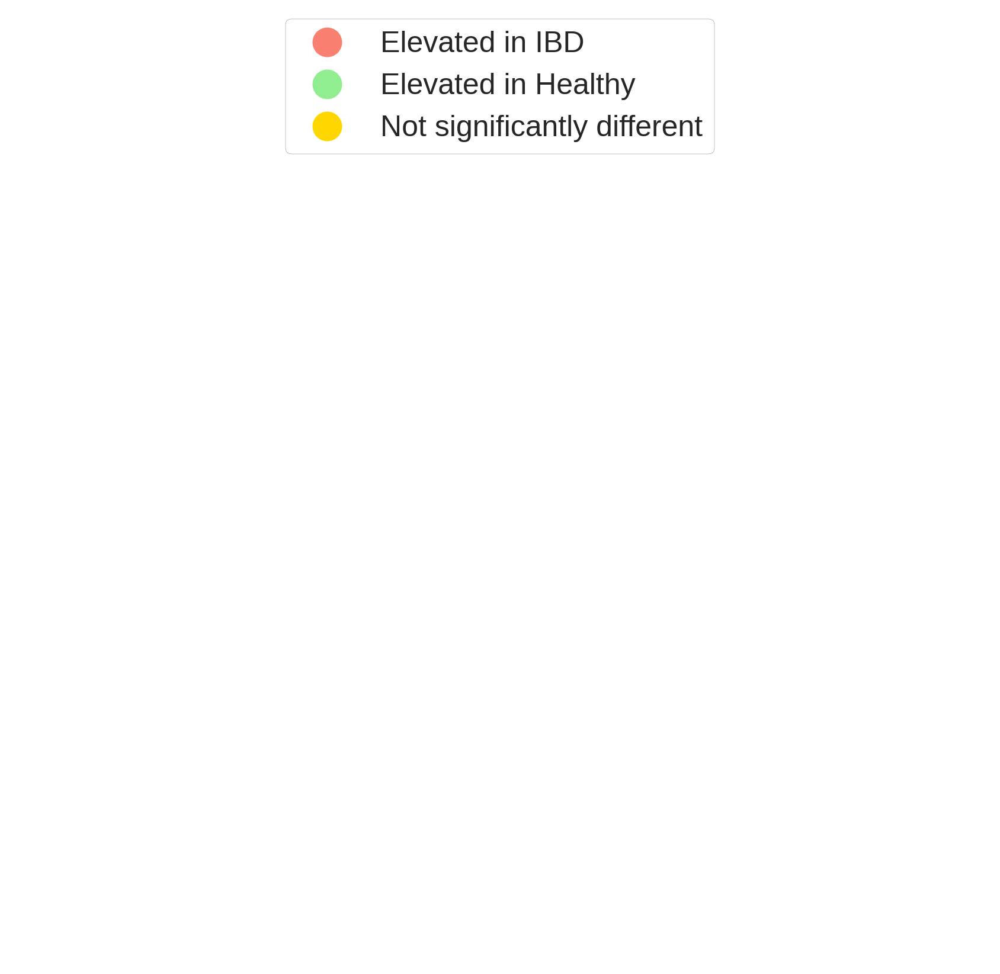

In [95]:
# Create the legend

G = ibdG
node_shape = "o"

fig, ax = plt.subplots(figsize=(30,30))
ax.set_facecolor("white")

# Remove the yticks
plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    labelleft=False,
    labelbottom=False)

hi_dct = {}
for i in labels.index:
    hi_dct[labels.loc[i, "Status"]] = labels.loc[i, "Color"]

# Create a list of colors for targets
color_list = []

for n in G.nodes:
    color_list.append(labels.loc[n.replace("\n", "_"), "Color"])


from matplotlib.lines import Line2D

legend_elements = []
for l in hi_dct.keys():
    legend_elements.append(Line2D([0], [0], label=l, color="none",\
                  marker=node_shape, markerfacecolor=hi_dct[l], markersize=50))

legend = ax.legend(handles=legend_elements, loc='upper center', ncol=1,
          facecolor="white", frameon=True, prop={"size":50}, edgecolor="k")
# legend.set_linewidth()

plt.savefig("../Fronteirs/Images/nets-composite-legend.tiff", dpi=300)

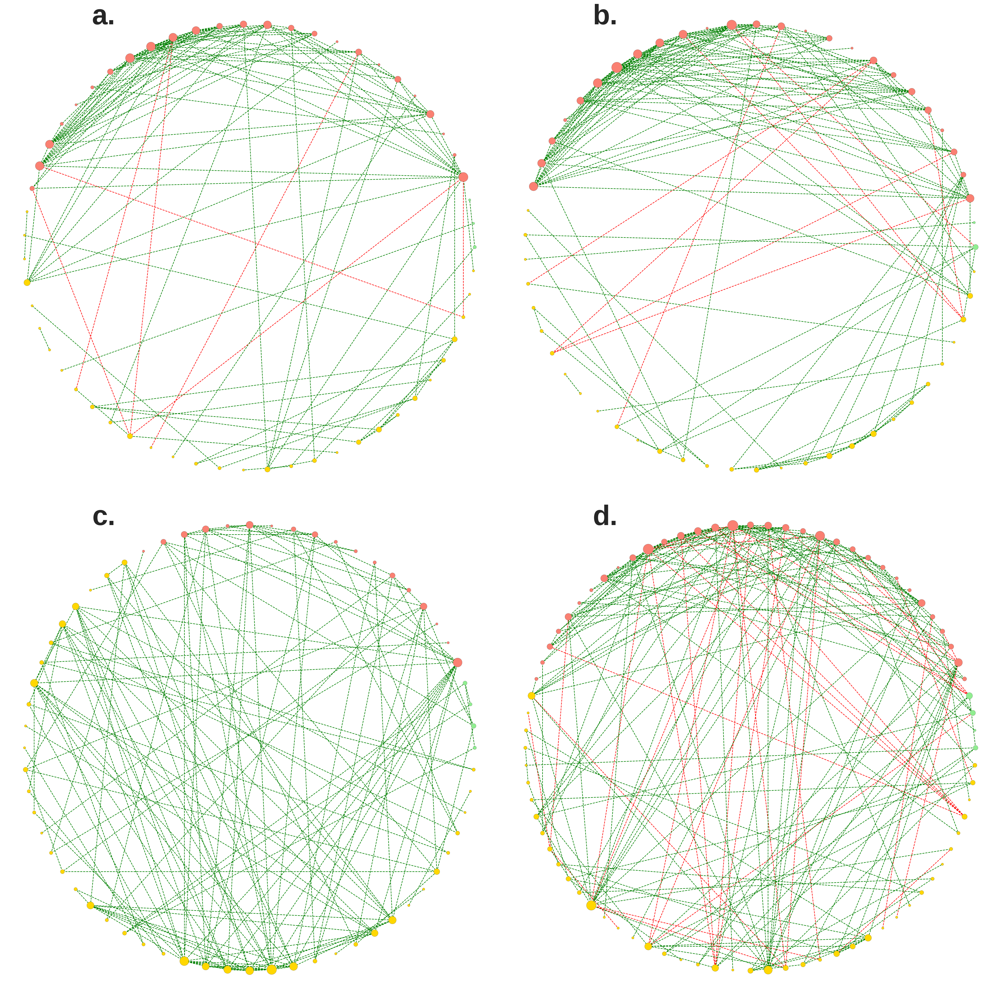

In [96]:
# # Add in the legend

# G = ibdG
# node_shape = "o"

# fig, ax = plt.subplots(figsize=(50,10))
# ax.set_facecolor("white")

# # Remove the yticks
# plt.tick_params(
#     axis='both',          # changes apply to the x-axis
#     which='both',      # both major and minor ticks are affected
#     bottom=False,      # ticks along the bottom edge are off
#     top=False,         # ticks along the top edge are off
#     left=False,
#     labelleft=False,
#     labelbottom=False)

# hi_dct = {}
# for i in labels.index:
#     hi_dct[labels.loc[i, "Status"]] = labels.loc[i, "Color"]

# # Create a list of colors for targets
# color_list = []

# for n in G.nodes:
#     color_list.append(labels.loc[n.replace("\n", "_"), "Color"])


# from matplotlib.lines import Line2D

# legend_elements = []
# for l in hi_dct.keys():
#     legend_elements.append(Line2D([0], [0], label=l, color="none",\
#                   marker=node_shape, markerfacecolor=hi_dct[l], markersize=50))

# legend = ax.legend(handles=legend_elements, loc='upper center', ncol=3,
#           facecolor="white", frameon=True, prop={"size":50}, edgecolor="k")
# # legend.set_linewidth()

plt.figure(figsize=(50,50))

plt.subplot(2,2,1)
DrawCircle(ibdG,"./DataFiles/DiffAbundanceList.csv", group="IBD", 
           label_nodes=False, label_degs=True)

plt.text(x=-0.7, y=1, s="a.", fontsize=100, weight='bold')

plt.subplot(2,2,2)
DrawCircle(nibdG,"./DataFiles/DiffAbundanceList.csv", group="non-IBD", 
           label_nodes=False, label_degs=True)

plt.text(x=-0.7, y=1, s="b.", fontsize=100, weight='bold')

plt.subplot(2,2,3)
DrawCircle(hmpG,"./DataFiles/DiffAbundanceList.csv", group="Healthy-1", 
           label_nodes=False, label_degs=True)

plt.text(x=-0.7, y=1, s="c.", fontsize=100, weight='bold')

plt.subplot(2,2,4)
DrawCircle(knsG,"./DataFiles/DiffAbundanceList.csv", group="Healthy-2", 
           label_nodes=False, label_degs=True)

plt.text(x=-0.7, y=1, s="d.", fontsize=100, weight='bold')

plt.tight_layout(pad=2)

# plt.savefig("../Fronteirs/Images/nets-composite.tiff", bbox_inches='tight', dpi=300)

# Functional analysis

In [97]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import os
import re
from tqdm.notebook import tqdm

from collections import Counter

from skbio.stats.composition import clr
import math
from statistics import mode
from scipy import stats

## Import the data

In [98]:
ibd_tigrs = pd.read_csv("DataFiles/ibd_tigrs.tsv", sep="\t", index_col="Unnamed: 0")
nibd_tigrs = pd.read_csv("DataFiles/nibd_tigrs.tsv", sep="\t", index_col="Unnamed: 0")
hmp_tigrs = pd.read_csv("DataFiles/hmp_tigrs.tsv", sep="\t", index_col="Unnamed: 0")
kns_tigrs = pd.read_csv("DataFiles/kns_tigrs.tsv", sep="\t", index_col="Unnamed: 0")

## Differential abundance analysis of TIGRFAM's

- Differential abundance analysis of the microbiome functions were performed using the TIGRFAM protein family database <sup>1</sup>

<br>

- **Overview**
    1. Group the TIGRFAM's by role
        * The TIGRFAM's relative abundances per sample have already been CLR-transformed
        * The sum is therefore of CLR-transformed values
    2. Compare the protein family roles in IBD vs control group using MWU

   
<br>
    
- Citations
    1. Haft, D H et al. “TIGRFAMs: a protein family resource for the functional identification of proteins.” Nucleic acids research vol. 29,1 (2001): 41-3. doi:10.1093/nar/29.1.41

In [99]:
def StatAnalysis(tigr1, tigr1_label, tigr2, tigr2_label, alpha=0.05):
    """
    Function to determine differentially abundant protien family roles
    
    Parameters
    ----------
    tigr1: DF containing the TIGRFAM's present in group 1
    tigr1_label: String specifying the name of group 1
    tigr2: DF containing the TIGRFAM's present in group 2
    tigr2_label: String specifying the name of group 2
    
    Returns
    -------
    DF object containing the results of the analysis
    
    """
    
    # Group the TIGRFAM's by assigned role
    temp1 = tigr1.groupby("Role").sum()
    tn1 = tigr1_label

    temp2 = tigr2.groupby("Role").sum()
    tn2 = tigr2_label
    
    res = {} # Prepare the dict to store the results in
    cols = [f"{tn1}_mean", f"{tn2}_mean", "p_val"] # Prepare the columns for the DF

    from scipy.stats import mannwhitneyu

    for i in temp1.index:
        m1 = temp1.loc[i].mean()
        m2 = temp2.loc[i].mean()

        u,p = mannwhitneyu(temp1.loc[i], temp2.loc[i])

        res[i] = [m1, m2, p]
    
    # Convert the dict into a DF
    rdf = pd.DataFrame.from_dict(res, orient="index", columns=cols)
    
    cnt = len(rdf[rdf.p_val < alpha])
    print(f"There are {cnt} significantly different TIGRFAMs")
    
    return rdf

There are 0 significantly different TIGRFAMs


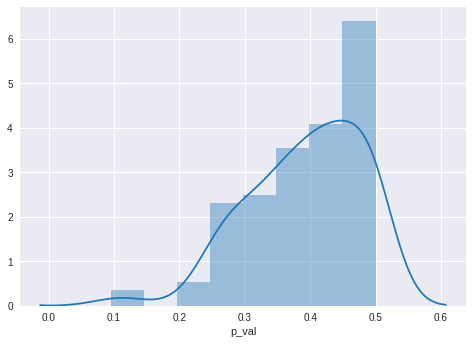

,IBD_mean,nonIBD_mean,p_val


In [100]:
alpha = 0.05
rdf0 = StatAnalysis(ibd_tigrs, "IBD", nibd_tigrs, "nonIBD")

sns.distplot(rdf0.p_val)
plt.show()

rdf0[rdf0.p_val < alpha]

There are 8 significantly different TIGRFAMs


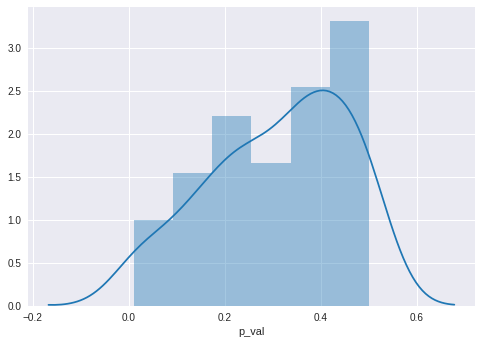

,Healthy-1_mean,IBD_mean,p_val
"Biosynthesis of cofactors, prosthetic groups, and carriers::Menaquinone and ubiquinone",15.386819,12.936798,0.036727
"Biosynthesis of cofactors, prosthetic groups, and carriers::Molybdopterin",3.697802,5.025676,0.013437
Cellular processes::Biosynthesis of natural products,76.291660,76.802052,0.025132
Cellular processes::Sporulation and germination,289.369355,297.803535,0.009964
DNA metabolism::Other,0.550322,1.140991,0.020465
Energy metabolism::Biosynthesis and degradation of polysaccharides,17.788775,24.721945,0.023926
Regulatory functions::Protein interactions,15.839144,17.847585,0.021959
Signal transduction::PTS,8.913744,11.237068,0.013952


In [101]:
alpha = 0.05
rdf1 = StatAnalysis(hmp_tigrs, "Healthy-1", ibd_tigrs, "IBD")

sns.distplot(rdf1.p_val)
plt.show()

rdf1[rdf1.p_val < alpha]

There are 10 significantly different TIGRFAMs


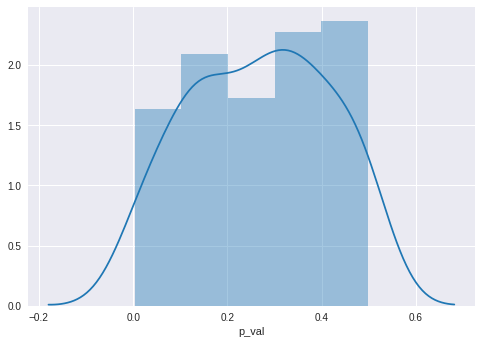

,Healthy-2_mean,IBD_mean,p_val
"Biosynthesis of cofactors, prosthetic groups, and carriers::Menaquinone and ubiquinone",14.844199,12.936798,0.035795
"Biosynthesis of cofactors, prosthetic groups, and carriers::Molybdopterin",4.293416,5.025676,0.019553
Cellular processes::Biosynthesis of natural products,76.311232,76.802052,0.008046
Cellular processes::Sporulation and germination,290.414656,297.803535,0.003199
DNA metabolism::Other,0.617969,1.140991,0.009762
Energy metabolism::Biosynthesis and degradation of polysaccharides,18.559697,24.721945,0.009448
Regulatory functions::DNA interactions,75.245692,78.848576,0.047576
Regulatory functions::Other,4.667214,6.335191,0.046915
Regulatory functions::Protein interactions,16.168242,17.847585,0.013505
Signal transduction::PTS,9.218070,11.237068,0.005963


In [102]:
alpha = 0.05
rdf2 = StatAnalysis(kns_tigrs, "Healthy-2", ibd_tigrs, "IBD")

sns.distplot(rdf2.p_val)
plt.show()

rdf2[rdf2.p_val < alpha]

In [103]:
# Find the differences that occur between IBD and both cohorts
external_diffs = [x for x in rdf1[rdf1.p_val < 0.05].index if x in rdf2[rdf2.p_val < 0.05].index]

display(rdf1.loc[external_diffs])
display(rdf2.loc[external_diffs])

,Healthy-1_mean,IBD_mean,p_val
"Biosynthesis of cofactors, prosthetic groups, and carriers::Menaquinone and ubiquinone",15.386819,12.936798,0.036727
"Biosynthesis of cofactors, prosthetic groups, and carriers::Molybdopterin",3.697802,5.025676,0.013437
Cellular processes::Biosynthesis of natural products,76.291660,76.802052,0.025132
Cellular processes::Sporulation and germination,289.369355,297.803535,0.009964
DNA metabolism::Other,0.550322,1.140991,0.020465
Energy metabolism::Biosynthesis and degradation of polysaccharides,17.788775,24.721945,0.023926
Regulatory functions::Protein interactions,15.839144,17.847585,0.021959
Signal transduction::PTS,8.913744,11.237068,0.013952


,Healthy-2_mean,IBD_mean,p_val
"Biosynthesis of cofactors, prosthetic groups, and carriers::Menaquinone and ubiquinone",14.844199,12.936798,0.035795
"Biosynthesis of cofactors, prosthetic groups, and carriers::Molybdopterin",4.293416,5.025676,0.019553
Cellular processes::Biosynthesis of natural products,76.311232,76.802052,0.008046
Cellular processes::Sporulation and germination,290.414656,297.803535,0.003199
DNA metabolism::Other,0.617969,1.140991,0.009762
Energy metabolism::Biosynthesis and degradation of polysaccharides,18.559697,24.721945,0.009448
Regulatory functions::Protein interactions,16.168242,17.847585,0.013505
Signal transduction::PTS,9.218070,11.237068,0.005963


In [104]:
# Combine and average the fold-diff of the features that are different between IBD and both healthy cohorts
ex_rdf = rdf1.copy().rename(columns={"Healthy-1_mean":"Healthy_mean"})

ex_rdf.Healthy_mean = (ex_rdf.Healthy_mean + rdf2["Healthy-2_mean"])/2

ex_rdf = ex_rdf[ex_rdf.p_val < 0.05]
ex_rdf

,Healthy_mean,IBD_mean,p_val
"Biosynthesis of cofactors, prosthetic groups, and carriers::Menaquinone and ubiquinone",15.115509,12.936798,0.036727
"Biosynthesis of cofactors, prosthetic groups, and carriers::Molybdopterin",3.995609,5.025676,0.013437
Cellular processes::Biosynthesis of natural products,76.301446,76.802052,0.025132
Cellular processes::Sporulation and germination,289.892005,297.803535,0.009964
DNA metabolism::Other,0.584145,1.140991,0.020465
Energy metabolism::Biosynthesis and degradation of polysaccharides,18.174236,24.721945,0.023926
Regulatory functions::Protein interactions,16.003693,17.847585,0.021959
Signal transduction::PTS,9.065907,11.237068,0.013952


In [105]:
def DiffViz(df, alpha=0.05, fold_diff_thresh=1, out=None, save=False, dpi=200, fc_df_out=False):
    """
    Function to calculate and visualize top-20 differences between the ILR-transformed data
    
    Paramters
    ---------
    df: Dataframe containing the statistical analysis
    alpha: q-value cut-off for significance
    fold_diff_thresh: Absolute value for minimum fold difference
    title_label: String for image title
    out: String specifying the image name
    save: Boolean for saving the image
    dpi: Integer specifiying the image DPI
    fc_df_out: Boolean to return the fold-change df
    
    Returns
    -------
    Image display (Top-n differencnes with q-val > alpha and diff > thresh)
    Saved image
    fc_df: fold-change DF containg only the significantly different Fold-Changes
    """
    
    global wdf
    wdf = df.copy() #working df
    diff_thresh = math.log(fold_diff_thresh)
            
    ######################Create the diffs (log fold-change)#####################################
    #1: find the rows containing the means
    rm = re.compile("_mean")
    mean_list = list(filter(rm.search,list(wdf.columns)))

    g1, g2 = mean_list #Store the groups into variables for easy use

    #2: Find the differences
    wdf["Diff"] = wdf.apply(lambda x:x[g1] - x[g2]\
                                     if x[g1]-x[g2] != 0\
                                     else 0, axis=1)
#     wdf["Diff"] = math.e ** wdf.Diff
    
    wdf["abs"] = abs(wdf["Diff"])
    wdf.sort_values(by='abs', ascending=False, inplace=True)
    wdf.drop("abs", axis=1, inplace=True)
    
    fc_df = wdf[wdf.p_val < alpha]
    
    ##################Create the fold-change graph##############################################
    mask1 = fc_df.Diff > diff_thresh #Higher in HMP -- Lower in IBD
    mask2 = fc_df.Diff < -1*diff_thresh #Lower in HMP -- Higher in IBD
    
    #Draw the graph labels
    name1 = g1.split("_")[0]
    name2 = g2.split("_")[0]
    
    plt.figure(figsize=(22,20))
    
    plot_len = len(fc_df[mask1].index) + len(fc_df[mask2].index) + 3 # Make this the length of the plot
    plt.xlim(-3, plot_len)
    plt.bar(fc_df.index[mask1], fc_df.Diff[mask1], color='green', 
            label=name1, edgecolor='black', linewidth=1)
    plt.bar(fc_df.index[mask2], fc_df.Diff[mask2], color='red', 
            label=name2, edgecolor='black', linewidth=1)
    
    
    plt.title(f"Log-ratio differences between {name1} and {name2} of at least {fold_diff_thresh}-fold difference\n", 
              size=20)
    plt.ylabel(r"Difference in Log-ratios (base $e$)"+"\n", size=22)
    
    #Remove the x-ticks
    plt.tick_params(axis='x', bottom=False, labelbottom=False)
    
    #Draw the labels and asterisks on the graph
    #Pos labels
    x = 0.2
    for i in fc_df[mask1].index:
        plt.annotate(i.replace("::", "\n"), xy=(x,-0.1), rotation=60, ha='right', va='top',\
                color='k', size=15)
            
        
        #Add q-value asterisks
        q = fc_df.loc[i]["p_val"]
        y = fc_df.loc[i]["Diff"]
        
        if q < 0.001:
            s = "***"
        elif q < 0.01:
            s = "**"
        else:
            s = "*"
        
        plt.annotate(s, xy=(x-0.2,y), ha='center', va='bottom', size=18)
        
        x+=1
        
        
    #Neg labels
    for i in fc_df[mask2].index:
        plt.annotate(i.replace("::", "\n"), xy=(x-0.5,0.1), rotation=60, ha='left', va='bottom',\
                color='k', size=15)

        #Add q-value asterisks
        q = fc_df.loc[i]["p_val"]
        y = fc_df.loc[i]["Diff"]
        
        if q < 0.001:
            s = "***"
        elif q < 0.01:
            s = "**"
        else:
            s = "*"
        
        plt.annotate(s, xy=(x-0.2,y-0.05), ha='center', va='top', size=18)
        
        x+=1
    
    
    # Label how many bacs are up, and how many are down
    xmin, xmax, ymin, ymax  = plt.axis()
    
#     plt.text(x=len(fc_df[mask1].index)/2, y=ymax-0.5, s=f"{len(fc_df[mask1])} bacteria", 
#              color='darkgreen', size=20, bbox={"facecolor":"white", "edgecolor":"k"})
    
#     plt.text(x=len(fc_df[mask2].index), y=ymin+0.5, s=f"{len(fc_df[mask2])} bacteria", 
#              color='maroon', size=20, bbox={"facecolor":"white", "edgecolor":"k"})
    
    #Add note explaining the q-value asterisks
    plt.text(x=xmin+0.1, y=ymin+0.5, s="""* indicates a p-value < 0.05
** indicates a p-value < 0.01
*** indicates a p-value < 0.001""", 
             bbox={'facecolor':'wheat', "edgecolor":"k"}, size=20)
    
    #Set up the save-option
    plt.tight_layout()
    
    if save:
        if not out:
            print("Out name required if you wish to save image")
        else:
            print("Image saved as '{}'".format(out))
            plt.savefig(out, dpi=dpi)
    
    plt.xticks(size=15)
    plt.yticks(size=15)
    
    plt.ylim(ymin, ymax+2)
    
    plt.legend(frameon=True, facecolor="white", 
              prop={"size":20})
#     plt.show()
    
    if fc_df_out:
        return fc_df

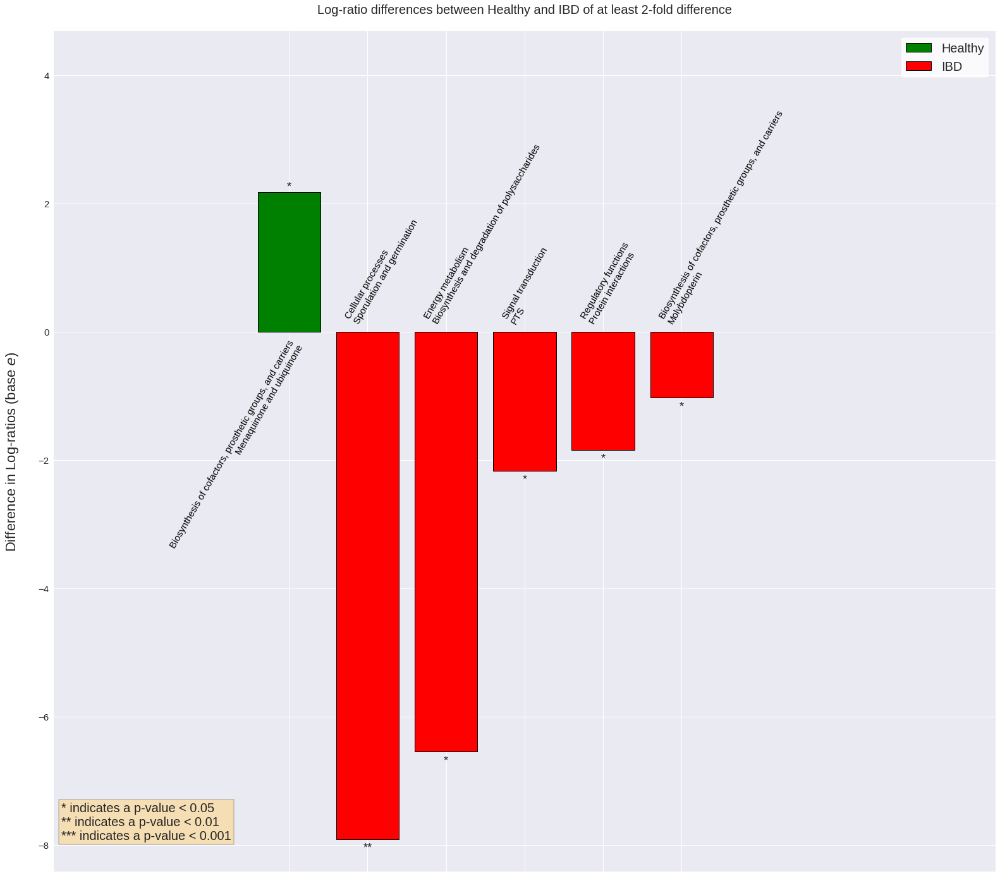

In [106]:
DiffViz(ex_rdf, fold_diff_thresh=2)

# plt.savefig("../Fronteirs/Images/functional-diffs.tiff", bbox_inches='tight', dpi=300)

In [107]:
lit_rev = pd.read_csv("/home/sayf/Projects/IBDMicrobiome/FunctionalAnalysis/LitReviewTable.csv", 
                      index_col="Species")
print(lit_rev.shape)
lit_rev.head()

(34, 5)


,DifferentialAbundance,SearchResults,Function,Keywords,Citations
Species,,,,,
Flavonifractor_plautii,Elevated in IBD,Associated with IBD,Degrades beneficial flavinoids,Inflammatory,"Gupta, A. et al. Association of Flavonifractor..."
Faecalicatena_contorta,Elevated in IBD,Novel,Novel,Novel,Novel
Blautia_hydrogenotrophica,Elevated in IBD,Associated with IBD,Multi-drug resistance,Antibiotic resistance,Novel
Clostridium_bolteae,Elevated in IBD,Associated with IBD,NaN,NaN,"Rodríguez, C. et al. Microbiota Insights in Cl..."
Clostridium_citroniae,Elevated in IBD,Novel,Novel,Novel,Novel


In [108]:
stat_ibd_others.head()

,IBD_mean,Q_value,nonIBD/Healthy_mean,Status
Faecalicatena_contorta,-1.137728,0.000136,-2.511528,Elevated in IBD
Blautia_hydrogenotrophica,0.855556,0.000144,-1.748621,Elevated in IBD
Flavonifractor_plautii,3.118436,0.000144,1.172628,Elevated in IBD
Clostridium_bolteae,2.217367,0.000144,0.145489,Elevated in IBD
Clostridium_citroniae,0.851851,0.000241,-1.299352,Elevated in IBD


In [109]:
# Find significant differences with at least 2-fold change
diffs2 = list(stat_ibd_others.apply(lambda x:x.name if abs(x["IBD_mean"] - x["nonIBD/Healthy_mean"]) > 0.7 \
                      else np.nan, 
                      axis=1).dropna())

print(len(diffs2))

stat_ibd_others.loc[diffs2]

42


,IBD_mean,Q_value,nonIBD/Healthy_mean,Status
Faecalicatena_contorta,-1.137728,0.000136,-2.511528,Elevated in IBD
Blautia_hydrogenotrophica,0.855556,0.000144,-1.748621,Elevated in IBD
Flavonifractor_plautii,3.118436,0.000144,1.172628,Elevated in IBD
Clostridium_bolteae,2.217367,0.000144,0.145489,Elevated in IBD
Clostridium_citroniae,0.851851,0.000241,-1.299352,Elevated in IBD
Eubacterium_siraeum,-4.005716,0.000241,-1.351469,Elevated in Healthy
Lachnoclostridium_sp_YL32,-0.663225,0.000241,-4.916257,Elevated in IBD
Oscillibacter_sp_PEA192,3.284906,0.000365,2.161059,Elevated in IBD
Clostridium_symbiosum,1.658018,0.000660,-0.019069,Elevated in IBD
Blautia_obeum,3.379553,0.000660,2.264211,Elevated in IBD


In [110]:
new_diffs = [x for x in diffs2 \
             if x not in lit_rev.index]

stat_ibd_others.loc[new_diffs]

,IBD_mean,Q_value,nonIBD/Healthy_mean,Status
Eubacterium_siraeum,-4.005716,0.000241,-1.351469,Elevated in Healthy
Alistipes_timonensis,-3.650145,0.001549,-1.040459,Elevated in Healthy
Gemmiger_formicilis,-0.236549,0.004149,1.814327,Elevated in Healthy
Barnesiella_intestinihominis,-1.348031,0.005821,1.285809,Elevated in Healthy
Alistipes_shahii,0.381921,0.013205,2.785592,Elevated in Healthy
Coprobacter_fastidiosus,-3.265157,0.019147,-1.145758,Elevated in Healthy
Alistipes_inops,-6.094201,0.022215,-2.901201,Elevated in Healthy
Alistipes_sp_MarseilleP5997,-2.630610,0.022338,-0.344765,Elevated in Healthy
Eubacterium_ramulus,1.164313,0.030013,0.462164,Elevated in IBD


In [111]:
old_diffs = [x for x in lit_rev.index \
             if x not in diffs2]
old_diffs

['Clostridium_innocuum']

In [112]:
new_lit = lit_rev.drop(old_diffs)
new_lit.to_csv("./DataFiles/LitReviewTable-edit.csv")

# Metadata visualizations

## non-IBD age analysis

In [113]:
nibd_meta = ibd_meta[ibd_meta.diagnosis == "nonIBD"]
nibd_meta.diagnosis.value_counts()

nonIBD    426
Name: diagnosis, dtype: int64

6.0


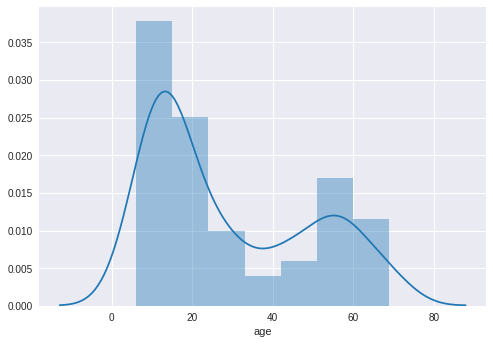

In [114]:
sns.distplot(nibd_meta.age)
print(ibd_meta.age.min())

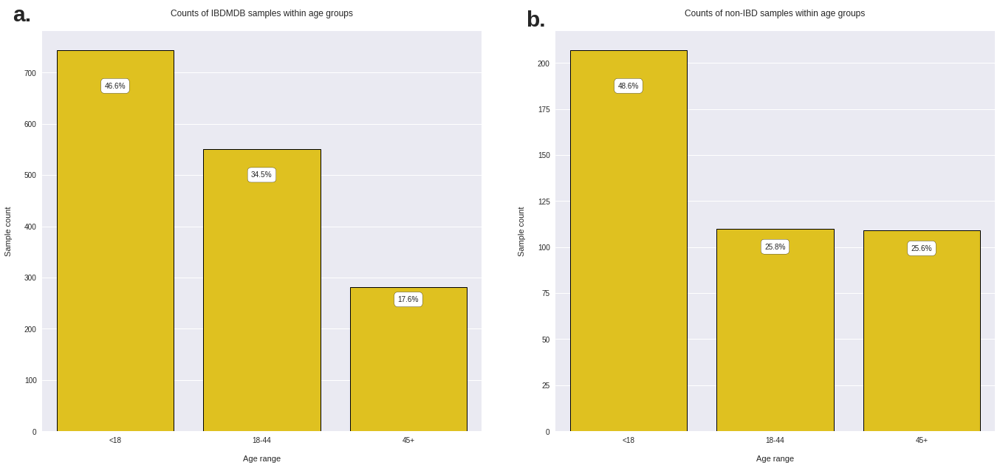

In [115]:
# Make composite plot of the age ranges for IBDMDB and non-IBD
plt.figure(figsize=(20,10))

# Subplot 1
plt.subplot(1,2,1)
ibd_meta["age_range"] = pd.cut(ibd_meta.age, 
                               bins=[0,18,45,100],
                               labels=["<18", "18-44", "45+"])

sns.countplot(ibd_meta.age_range,
             color='gold', edgecolor='k', linewidth=1)

plt.title("Counts of IBDMDB samples within age groups\n")
plt.xlabel("\nAge range")
plt.ylabel("Sample count\n")

# Label the exact number of samples on the bar for ease of viewing (use all samples from study)
x=0
for i in ["<18", "18-44", "45+"]:
    n = len(ibd_meta[ibd_meta.age_range == i])
    perc = round(n/len(ibd_meta)*100,1)
    plt.text(x=x, y=n*0.9, s=f"{perc}%", ha='center',
            bbox=dict(facecolor='white', boxstyle="round, pad=0.5"))
    
    x+=1
    
plt.text(x=-0.7, y=800, s="a.", weight='bold', fontsize=30)
    
# Subplot 2
plt.subplot(1,2,2)
nibd_meta["age_range"] = pd.cut(nibd_meta.age, 
                               bins=[0,18,45,100],
                               labels=["<18", "18-44", "45+"])

sns.countplot(nibd_meta.age_range,
             color='gold', edgecolor='k', linewidth=1)

plt.title("Counts of non-IBD samples within age groups\n")
plt.xlabel("\nAge range")
plt.ylabel("Sample count\n")

# Label the exact number of samples on the bar for ease of viewing (use all samples from study)
x=0
for i in ["<18", "18-44", "45+"]:
    n = len(nibd_meta[nibd_meta.age_range == i])
    perc = round(n/len(nibd_meta)*100,1)
    plt.text(x=x, y=n*0.9, s=f"{perc}%", ha='center',
            bbox=dict(facecolor='white', boxstyle="round, pad=0.5"))
    
    x+=1

plt.text(x=-0.7, y=220, s="b.", weight='bold', fontsize=30)
    
plt.tight_layout(pad=5)
# plt.savefig("../Fronteirs/Images/ibdmdb-age-ranges-composite.tiff", dpi=300, bbox_inches='tight')

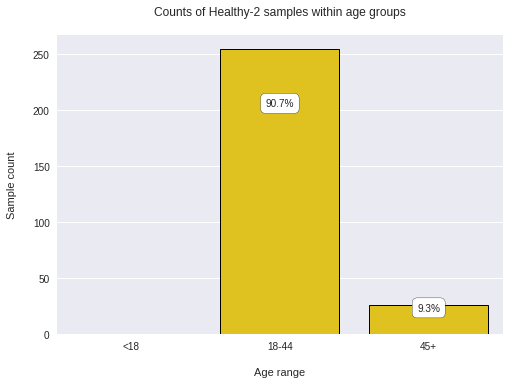

In [116]:
kmd["age_range"] = pd.cut(kmd.age, 
                               bins=[0,18,45,100],
                               labels=["<18", "18-44", "45+"])

sns.countplot(kmd.age_range,
             color='gold', edgecolor='k', linewidth=1)

plt.title("Counts of Healthy-2 samples within age groups\n")
plt.xlabel("\nAge range")
plt.ylabel("Sample count\n")

# Label the exact number of samples on the bar for ease of viewing (use all samples from study)
x=1
for i in ["18-44", "45+"]:
    n = len(kmd[kmd.age_range == i])
    perc = round(n/len(kmd)*100,1)
    plt.text(x=x, y=n*0.8, s=f"{perc}%", ha='center',
            bbox=dict(facecolor='white', boxstyle="round, pad=0.5"))
    
    x+=1
    
plt.savefig("../Fronteirs/Images/kns-age-range.tiff", bbox_inches='tight', dpi=300)

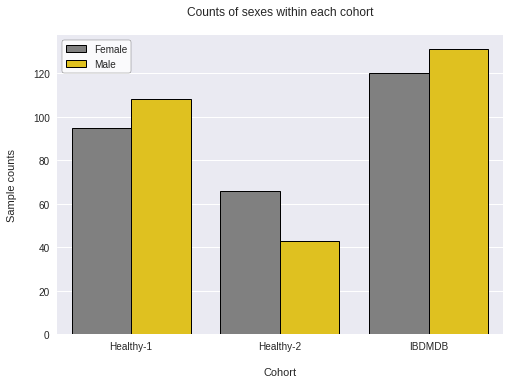

In [117]:
sns.countplot(data=dfm, x='Cohort', hue='sex', 
             palette=['gray', 'gold'], linewidth=1, edgecolor='k')

plt.title("Counts of sexes within each cohort\n")
plt.xlabel("\nCohort")
plt.ylabel("Sample counts\n")

plt.legend(frameon=True, edgecolor='k', facecolor='white')

# plt.savefig("../Fronteirs/Images/sex-counts.tiff", dpi=300)

In [118]:
dfm.head()

,sex,age,diagnosis,SubID,UniqID,Cohort
SampleName,,,,,,
SRS011061,Female,26.0,Healthy,SRS011061,vdph,Healthy-1
SRS011084,Male,26.0,Healthy,SRS011084,jkom,Healthy-1
SRS011134,Male,26.0,Healthy,SRS011134,ejuk,Healthy-1
SRS011239,Female,26.0,Healthy,SRS011239,bstj,Healthy-1
SRS011271,Male,26.0,Healthy,SRS011271,pvmy,Healthy-1


## Replicate mean and median

In [119]:
# Quickly examine the distribution of the replicates
for c in dfm.Cohort.unique():
    cnts = list(dict(Counter(dfm[dfm.Cohort == c]["UniqID"])).values())
    print(f"\nCohort: {c}")
    print("-" * (7 + len(c)))
    print(f"Mean: {round(np.mean(cnts),2)}")
    print(f"Median: {round(np.median(cnts),2)}")


Cohort: Healthy-1
----------------
Mean: 1.0
Median: 1.0

Cohort: Healthy-2
----------------
Mean: 3.3
Median: 3.0

Cohort: IBDMDB
-------------
Mean: 2.49
Median: 2.0
